# C6_Chained_crossing (Block C, C6) - loading the tables and the figures

This notebook **computes nothing**. It loads the csvs `aggregate.py` and
`tables.py` wrote and displays the figures `plot.py` drew, in the order the
README tells the story. Every number shown here is read from a file on disk.

Run order that produced them:

```bash
PY=/data/bfys/gscriven/conda/envs/TE/bin/python
export PYTHONNOUSERSITE=1
$PY build_tracks.py          # the 1,000 crossings, once
$PY measure_timing.py        # what a job costs
$PY make_jobs.py && condor_submit condor/jobs_chain.sub
$PY aggregate.py             # the records -> the three long tables
$PY tables.py && $PY plot.py # the display tables, the ranking, the figures
```

In [1]:
import json
import os

import pandas as pd
from IPython.display import Image, Markdown, display

R = "results"
F = "figures"
pd.set_option("display.width", 200)
pd.set_option("display.max_columns", 40)


def show(path, **kw):
    if os.path.exists(path):
        display(Image(filename=path, **kw))
    else:
        display(Markdown("*%s has not been drawn yet*" % path))

## The track list, and the two floors it carries

In [2]:
meta = json.load(open(os.path.join(R, "chain_tracks_meta.json")))
print(json.dumps(meta, indent=1)[:2500])
tracks = pd.read_csv(os.path.join(R, "chain_tracks.csv"))
display(tracks.head())
print(tracks.describe()[["dz_mm", "p_GeV", "hit_vs_reference_um"]])

{
 "kind": "chain_tracks_v1",
 "created": "2026-09-08 13:02:49",
 "what": "the 1,000 whole-magnet crossings every network is chained over in Block C step C6",
 "source": "../Step_size_and_stage_grid/results/magnet_tracks_v3_residual.npz",
 "rows": "the full-crossing stratum of the v3 TEST split, in prepare_nodes.pick_rows order; the first 500 forward and the first 500 backward",
 "split_parity_vs_grid_q08": {
  "start_state_max_abs_diff": 0.0,
  "z0_max_abs_diff": 0.0,
  "dz_max_abs_diff": 0.0,
  "end_state_max_abs_diff": 0.0,
  "n": 12000
 },
 "n_tracks": 1000,
 "n_forward": 500,
 "n_backward": 500,
 "n_particles": 581,
 "crossing_length_mm": {
  "min": 5156.414794921875,
  "median": 5175.7919921875,
  "max": 6669.541748046875
 },
 "momentum_GeV": {
  "min": 1.844138264656067,
  "median": 6.34235405921936,
  "max": 142.15945434570312
 },
 "far_plane_hit": {
  "source": "/data/bfys/gscriven/LHCb_Extrapolation_Project/Data_generation_exploration/Official_xdigi/results/states.npz",
  "ru

,track,row,evt,mckey,direction,p_GeV,eta,pid,z0_mm,z1_mm,dz_mm,hit_z_mm,hit_minus_far_plane_z_mm,hit_vs_reference_um
0,0,58000,0,1826,1,23.20920,4.47641,211,2641.846436,7825.870605,5184.024170,7825.870385,-0.000220,256.549
1,1,58002,0,4536,1,4.11373,3.29096,211,2656.846436,7828.125000,5171.278564,7828.124766,-0.000234,7166.910
2,2,58004,0,5065,1,10.17440,2.63948,211,2656.846436,7824.627441,5167.781006,7824.627481,0.000039,1037.690
3,3,58006,0,5335,1,3.27352,2.47668,211,2648.153564,7822.839355,5174.685791,7822.839257,-0.000099,18854.800
4,4,58008,0,5363,1,3.64989,3.33786,-211,2648.153564,7827.830078,5179.676514,7827.829839,-0.000239,6110.280


             dz_mm        p_GeV  hit_vs_reference_um
count  1000.000000  1000.000000          1000.000000
mean      2.032429    10.899936          3382.840902
std    5197.427625    13.167241          6314.215324
min   -6669.541748     1.844140            15.711600
25%   -5175.579346     3.900720           580.223500
50%       0.746948     6.342355          1643.260000
75%    5175.981811    12.457500          3729.132500
max    6669.541748   142.159000        110930.000000


## What a job cost, and what the cluster did

In [3]:
print(json.dumps(json.load(open(os.path.join(R, "timing.json"))), indent=1))
landed = pd.read_csv(os.path.join(R, "landed.csv"))
print("%d records landed" % len(landed))
display(landed.groupby(["depth", "width"])["wall_s"].describe()[
    ["count", "min", "50%", "max"]])
pending = pd.read_csv(os.path.join(R, "pending.csv"))
print("%d pending" % len(pending))

{
 "created": "2026-09-08 13:13:35",
 "host": "stbc-i2.nikhef.nl",
 "rule": "if the projected 8 x 256 job exceeds 8 h the 0.1 mm column is cut to 100 + 100 tracks",
 "median_steps_at_0.1mm": 51758,
 "columns": [
  {
   "name": "0.1 mm",
   "nominal_dz_mm": 0.1,
   "n_per_direction": 250
  },
  {
   "name": "1 mm",
   "nominal_dz_mm": 1.0,
   "n_per_direction": 500
  },
  {
   "name": "10 mm",
   "nominal_dz_mm": 10.0,
   "n_per_direction": 500
  },
  {
   "name": "100 mm",
   "nominal_dz_mm": 100.0,
   "n_per_direction": 500
  },
  {
   "name": "1000 mm",
   "nominal_dz_mm": 1000.0,
   "n_per_direction": 500
  },
  {
   "name": "full crossing",
   "nominal_dz_mm": null,
   "n_per_direction": 500
  }
 ],
 "column_probes": [
  {
   "tag": "w256_d8_q20_physics_s0",
   "architecture": "8x256",
   "q": 20,
   "n_parameters": 484180,
   "n_tracks": 10,
   "steps_per_track_median": 51730,
   "sample_steps": 517422,
   "wall_s": 178.93,
   "us_per_sample_step": 345.81,
   "peak_rss_gb": 0.6
  

count     min      50%     max
depth width                                
2     32      60.0   219.8   298.45   418.1
      64      60.0   240.8   337.45   481.4
      128     60.0   312.7   428.15   510.2
      256     60.0   454.3   652.70   799.4
4     32      60.0   238.5   326.65   443.5
      64      60.0   337.9   411.10   538.4
      128     60.0   553.5   614.40   723.6
      256     60.0  1011.4  1087.50  1349.2
8     32      60.0   283.9   398.75   582.7
      64      60.0   369.9   552.65   704.3
      128     60.0   652.0   930.50  1147.0
      256     60.0  1679.0  1930.15  2650.7

0 pending


## The reference rows every table is read against

In [4]:
refs = pd.read_csv(os.path.join(R, "reference_rows.csv"))
display(refs[(refs.direction == "all") & (refs.component == "max_xy")
             & (refs.reference == "fine")])

,predictor,column,direction,component,reference,unit,median_abs,p95_abs,mean,rms,n
4,straight line,0.1 mm,all,max_xy,fine,um,489113.00000,1263360.0,555457.00,670119.00,500
14,material floor,0.1 mm,all,max_xy,fine,um,1678.33000,11094.4,3318.17,6353.47,500
19,reference floor,0.1 mm,all,max_xy,fine,um,0.00005,NaN,NaN,NaN,500
64,straight line,1 mm,all,max_xy,fine,um,478269.00000,1296880.0,558059.00,675242.00,1000
74,material floor,1 mm,all,max_xy,fine,um,1643.26000,12172.4,3382.84,7160.52,1000
79,reference floor,1 mm,all,max_xy,fine,um,0.00005,NaN,NaN,NaN,1000
124,straight line,10 mm,all,max_xy,fine,um,478269.00000,1296880.0,558059.00,675242.00,1000
134,material floor,10 mm,all,max_xy,fine,um,1643.26000,12172.4,3382.84,7160.52,1000
139,reference floor,10 mm,all,max_xy,fine,um,0.00005,NaN,NaN,NaN,1000
184,straight line,100 mm,all,max_xy,fine,um,478269.00000,1296880.0,558059.00,675242.00,1000


## The chained-crossing tables

Cells are `median [min-max over seeds]` of max(|dx|, |dy|) at the far plane
against the fine reference, in micrometres.

In [5]:
for arch in ("4x64", "8x256"):
    p = os.path.join(R, "chained_table_%s.csv" % arch)
    if os.path.exists(p):
        display(Markdown("### %s, both directions pooled" % arch))
        display(pd.read_csv(p))

### 4x64, both directions pooled

,row,arm,0.1 mm,1 mm,10 mm,100 mm,1000 mm,full crossing
0,q=2,physics,1.81e+05 [1.22e+05-2.04e+05],1.73e+05 [1.3e+05-2.08e+05],1.29e+05 [9.99e+04-1.48e+05],1.33e+04 [1.1e+04-1.86e+04],2.84e+03 [2.12e+03-3.42e+03],1.07e+04 [5.17e+03-2.66e+04]
1,q=2,twin,6.12e+04 [4.23e+04-8.22e+04],3.19e+03 [2.6e+03-3.98e+03],3.92e+03 [3.07e+03-4.37e+03],3.91e+03 [3.71e+03-5.73e+03],4.74e+03 [3.94e+03-8.99e+03],4.02e+03 [3.04e+03-4.84e+03]
2,q=4,physics,2.02e+05 [1.59e+05-2.38e+05],1.98e+05 [1.53e+05-2.64e+05],1.61e+05 [1.22e+05-2.05e+05],1.72e+04 [1.05e+04-2.43e+04],2.77e+03 [2.28e+03-3.16e+03],3.78e+03 [2.87e+03-5.37e+03]
3,q=4,twin,5.26e+04 [2.79e+04-1.31e+05],4.3e+03 [3.26e+03-7.23e+03],3.61e+03 [3.17e+03-4.74e+03],3.95e+03 [3.37e+03-5.37e+03],4.35e+03 [3.91e+03-9.69e+03],4.02e+03 [3.26e+03-7.16e+03]
4,q=6,physics,1.93e+05 [1.31e+05-2.37e+05],1.91e+05 [1.28e+05-2.4e+05],1.51e+05 [1.08e+05-1.78e+05],1.63e+04 [1.43e+04-2.43e+04],2.94e+03 [2.7e+03-3.59e+03],791 [692-918]
5,q=6,twin,1.02e+05 [2.16e+04-2.27e+05],5.04e+03 [2.22e+03-1.04e+04],4.98e+03 [2.03e+03-6.03e+03],5.16e+03 [2.52e+03-7.7e+03],8.11e+03 [3.53e+03-1.48e+04],5.93e+03 [3.99e+03-9.41e+03]
6,q=8,physics,2.73e+05 [2.26e+05-3.96e+05],2.67e+05 [2.46e+05-4.06e+05],2.03e+05 [1.91e+05-2.83e+05],1.4e+04 [1.17e+04-2.46e+04],2.81e+03 [2.27e+03-3.35e+03],837 [645-977]
7,q=8,twin,8.66e+04 [3.54e+04-1.8e+05],4.7e+03 [3.43e+03-1.03e+04],4.15e+03 [2.88e+03-6.07e+03],5.07e+03 [2.91e+03-9.29e+03],9.09e+03 [8.29e+03-1.17e+04],5.36e+03 [4.43e+03-1.23e+04]
8,q=10,physics,3.1e+05 [2.1e+05-5.83e+05],3.17e+05 [2.05e+05-5.16e+05],2.45e+05 [1.58e+05-3.83e+05],1.46e+04 [9.21e+03-1.88e+04],3.1e+03 [2.43e+03-3.19e+03],769 [707-899]
9,q=10,twin,7e+04 [6.1e+04-1.72e+05],5.53e+03 [4.42e+03-8.56e+03],4.28e+03 [3.55e+03-5.57e+03],4.67e+03 [3.95e+03-6.62e+03],9.17e+03 [7.62e+03-1.2e+04],5.45e+03 [3.93e+03-7.71e+03]


### 8x256, both directions pooled

,row,arm,0.1 mm,1 mm,10 mm,100 mm,1000 mm,full crossing
0,q=2,physics,6.04e+04 [4.51e+04-1.08e+05],5.74e+04 [4.19e+04-1.21e+05],4.34e+04 [3.15e+04-8.49e+04],1.13e+04 [9.45e+03-1.43e+04],2.69e+03 [2.13e+03-2.96e+03],1.06e+04 [5.08e+03-2.61e+04]
1,q=2,twin,2.04e+05 [1.43e+05-2.66e+05],1.44e+04 [9.47e+03-1.95e+04],5.73e+03 [3.97e+03-1.07e+04],4.88e+03 [4.24e+03-6.96e+03],7.51e+03 [6e+03-1.23e+04],6.21e+03 [4.05e+03-7.1e+03]
2,q=4,physics,8.21e+04 [6.42e+04-1.08e+05],7.85e+04 [6.69e+04-1.14e+05],5.51e+04 [5e+04-8.31e+04],9.22e+03 [6.73e+03-9.77e+03],2.69e+03 [2.28e+03-3.07e+03],3.71e+03 [2.69e+03-5.23e+03]
3,q=4,twin,2.32e+05 [1.08e+05-3.52e+05],1.31e+04 [2.6e+03-2.94e+04],9.72e+03 [905-1.19e+04],5.87e+03 [1.22e+03-1.3e+04],8.22e+03 [2.21e+03-1.24e+04],6.48e+03 [1.08e+03-8.22e+03]
4,q=6,physics,1.07e+05 [7.2e+04-2.95e+05],1.11e+05 [6.29e+04-2.74e+05],7.92e+04 [4.74e+04-1.82e+05],9.67e+03 [6.24e+03-1.51e+04],2.68e+03 [2.04e+03-3.36e+03],817 [717-889]
5,q=6,twin,1.64e+05 [1.46e+05-2.98e+05],1.12e+04 [5.94e+03-5.78e+04],4.27e+03 [1.64e+03-6.7e+03],4.22e+03 [2.02e+03-4.58e+03],9.44e+03 [3.24e+03-1.1e+04],4.5e+03 [1.78e+03-5.61e+03]
6,q=8,physics,1.36e+05 [6.96e+04-2.02e+05],1.4e+05 [6.45e+04-2e+05],9e+04 [5.01e+04-1.34e+05],1.16e+04 [8.35e+03-1.45e+04],2.29e+03 [1.76e+03-3.23e+03],695 [513-876]
7,q=8,twin,1.84e+05 [9.04e+04-2.23e+05],1.22e+04 [2.52e+03-3.32e+04],6.28e+03 [2.02e+03-7.27e+03],6.69e+03 [2.12e+03-9.6e+03],6.89e+03 [2.24e+03-1.02e+04],6.8e+03 [2.17e+03-7.18e+03]
8,q=10,physics,1.51e+05 [7.63e+04-2.21e+05],1.51e+05 [7.63e+04-1.93e+05],9.65e+04 [5.82e+04-1.26e+05],9.64e+03 [8.66e+03-1.39e+04],2.52e+03 [1.93e+03-2.96e+03],741 [640-890]
9,q=10,twin,2.07e+05 [1.42e+05-3.84e+05],1.32e+04 [8.1e+03-2.9e+04],5.54e+03 [4.06e+03-8.47e+03],5.25e+03 [4.49e+03-6.79e+03],1.03e+04 [7.24e+03-1.44e+04],5.24e+03 [4.47e+03-6.28e+03]


In [6]:
for suffix in ("_x", "_y", "_tx", "_ty", "_hit"):
    p = os.path.join(R, "chained_table_4x64%s.csv" % suffix)
    if os.path.exists(p):
        display(Markdown("### 4x64%s" % suffix))
        display(pd.read_csv(p))

### 4x64_x

,row,arm,0.1 mm,1 mm,10 mm,100 mm,1000 mm,full crossing
0,q=2,physics,1.81e+05 [1.22e+05-2.04e+05],1.73e+05 [1.3e+05-2.08e+05],1.29e+05 [9.99e+04-1.48e+05],1.25e+04 [1.01e+04-1.85e+04],2.55e+03 [1.8e+03-3.12e+03],8.93e+03 [4.54e+03-2.66e+04]
1,q=2,twin,6.12e+04 [4.23e+04-8.22e+04],2.34e+03 [2.01e+03-3.08e+03],2.15e+03 [1.82e+03-3.41e+03],2.88e+03 [2.58e+03-4.45e+03],3.96e+03 [2.71e+03-8.11e+03],2.37e+03 [1.93e+03-3.13e+03]
2,q=4,physics,2.02e+05 [1.59e+05-2.38e+05],1.98e+05 [1.53e+05-2.64e+05],1.61e+05 [1.22e+05-2.05e+05],1.63e+04 [9.51e+03-2.36e+04],2.32e+03 [2.07e+03-2.62e+03],3.68e+03 [2.82e+03-5.36e+03]
3,q=4,twin,5.26e+04 [2.77e+04-1.31e+05],2.59e+03 [1.38e+03-6.3e+03],2.48e+03 [1.92e+03-3.79e+03],2.73e+03 [2.17e+03-3.25e+03],3.56e+03 [2.69e+03-7.9e+03],3.09e+03 [2.13e+03-5.32e+03]
4,q=6,physics,1.93e+05 [1.31e+05-2.37e+05],1.91e+05 [1.28e+05-2.4e+05],1.51e+05 [1.08e+05-1.78e+05],1.46e+04 [1.29e+04-2.41e+04],2.64e+03 [2.21e+03-2.84e+03],698 [589-816]
5,q=6,twin,1.02e+05 [2.11e+04-2.27e+05],3.91e+03 [1.66e+03-8.72e+03],2.98e+03 [1.69e+03-4.73e+03],3.57e+03 [1.5e+03-6.86e+03],6.76e+03 [2.8e+03-1.41e+04],4.56e+03 [2.79e+03-7.15e+03]
6,q=8,physics,2.73e+05 [2.26e+05-3.96e+05],2.67e+05 [2.46e+05-4.06e+05],2.03e+05 [1.91e+05-2.83e+05],1.34e+04 [9.7e+03-2.42e+04],2.46e+03 [1.75e+03-3.25e+03],723 [560-851]
7,q=8,twin,8.66e+04 [3.44e+04-1.8e+05],3.59e+03 [2.17e+03-8.32e+03],3.27e+03 [1.92e+03-5.66e+03],4.04e+03 [2.53e+03-8.56e+03],7.61e+03 [6.62e+03-1.12e+04],3.85e+03 [3.08e+03-1.05e+04]
8,q=10,physics,3.1e+05 [2.1e+05-5.83e+05],3.17e+05 [2.05e+05-5.16e+05],2.45e+05 [1.58e+05-3.83e+05],1.35e+04 [8.59e+03-1.81e+04],2.8e+03 [2.08e+03-2.95e+03],715 [636-849]
9,q=10,twin,6.74e+04 [4.29e+04-1.72e+05],4.44e+03 [2.54e+03-7.08e+03],2.84e+03 [2.6e+03-4.01e+03],3.49e+03 [2.04e+03-4.18e+03],7.32e+03 [6.7e+03-1.15e+04],4.19e+03 [2.07e+03-6.14e+03]


### 4x64_y

,row,arm,0.1 mm,1 mm,10 mm,100 mm,1000 mm,full crossing
0,q=2,physics,4.49e+03 [3.29e+03-6.02e+03],4.52e+03 [3.37e+03-6.71e+03],4.3e+03 [3.17e+03-6.76e+03],2.69e+03 [2.31e+03-3.98e+03],1.02e+03 [974-1.34e+03],753 [598-1.05e+03]
1,q=2,twin,2.43e+03 [1.66e+03-2.63e+03],1.77e+03 [1.22e+03-1.98e+03],2.19e+03 [1.82e+03-2.63e+03],1.99e+03 [1.68e+03-3.47e+03],2.02e+03 [1.48e+03-2.68e+03],1.98e+03 [1.5e+03-2.4e+03]
2,q=4,physics,5.66e+03 [2.36e+03-9.7e+03],5.11e+03 [2.6e+03-1.03e+04],4.73e+03 [2.68e+03-9.79e+03],2.54e+03 [2.21e+03-3.28e+03],1.09e+03 [774-1.36e+03],322 [282-359]
3,q=4,twin,2.63e+03 [2.04e+03-3.13e+03],2.26e+03 [1.34e+03-2.84e+03],1.78e+03 [1.14e+03-2.85e+03],2.27e+03 [1.77e+03-2.46e+03],1.71e+03 [1.34e+03-2.53e+03],1.74e+03 [1.24e+03-3.14e+03]
4,q=6,physics,5.2e+03 [2.67e+03-8.74e+03],5.15e+03 [2.6e+03-8.52e+03],4.74e+03 [2.46e+03-7.73e+03],2.65e+03 [1.77e+03-4.7e+03],964 [891-1.08e+03],268 [234-277]
5,q=6,twin,2.16e+03 [1.37e+03-3.38e+03],1.86e+03 [827-2.74e+03],1.86e+03 [787-3.22e+03],1.77e+03 [1.03e+03-3.04e+03],1.77e+03 [1.39e+03-2.78e+03],2.66e+03 [1.1e+03-2.83e+03]
6,q=8,physics,4.49e+03 [2.48e+03-5.83e+03],4.18e+03 [2.34e+03-6.21e+03],4.56e+03 [2.78e+03-6.63e+03],2.76e+03 [1.45e+03-3.6e+03],973 [759-1.2e+03],251 [205-284]
7,q=8,twin,2.16e+03 [1.19e+03-2.36e+03],1.84e+03 [1.18e+03-2.54e+03],1.83e+03 [1.15e+03-2.56e+03],1.96e+03 [1.18e+03-2.59e+03],1.94e+03 [1.15e+03-3.25e+03],2.08e+03 [1.27e+03-2.97e+03]
8,q=10,physics,5.25e+03 [3.51e+03-1.02e+04],5.21e+03 [3.77e+03-1.07e+04],5.38e+03 [3.87e+03-8.45e+03],2.79e+03 [2.53e+03-5.06e+03],869 [698-1.01e+03],243 [220-303]
9,q=10,twin,3.57e+03 [2.04e+03-4.03e+03],2.29e+03 [1.18e+03-3.05e+03],1.81e+03 [1.02e+03-2.86e+03],2.04e+03 [1.05e+03-3.52e+03],2.12e+03 [1.08e+03-3.36e+03],2.77e+03 [1.52e+03-3.58e+03]


### 4x64_tx

,row,arm,0.1 mm,1 mm,10 mm,100 mm,1000 mm,full crossing
0,q=2,physics,52.2 [34.9-75.5],51.7 [36.4-73.9],41.1 [28.8-57],4.13 [3.38-5.85],0.987 [0.643-1.13],4.05 [4.03-4.1]
1,q=2,twin,27 [17.6-38.7],0.927 [0.673-1.21],0.846 [0.706-1.18],1.01 [0.904-1.63],1.19 [1.04-3.21],0.867 [0.719-1.75]
2,q=4,physics,64.1 [44.9-81.6],64 [44.2-95.4],53.3 [35.6-77.6],5.89 [3.27-7.64],0.895 [0.67-1.07],1.56 [1.45-1.63]
3,q=4,twin,31.8 [13.9-47.5],1.04 [0.635-2.56],0.927 [0.739-1.35],0.959 [0.725-1.2],1.47 [0.931-1.87],0.991 [0.823-3.44]
4,q=6,physics,62.6 [33.6-94.4],59.5 [33.2-99.5],49.7 [27.9-78.9],5.43 [4.56-8.16],0.989 [0.859-1.37],0.197 [0.17-0.233]
5,q=6,twin,44.5 [8.16-131],1.42 [0.517-3.86],1.14 [0.546-1.96],1.45 [0.68-2.84],2.2 [1.09-2.73],2.08 [0.687-3.15]
6,q=8,physics,92.7 [60.1-150],96.3 [60.4-152],72.5 [50.4-111],5.03 [3.95-7.98],0.91 [0.77-1.07],0.173 [0.147-0.209]
7,q=8,twin,37 [17-68.9],1.28 [0.846-2.97],1.06 [0.749-2.19],1.47 [0.924-2.62],1.73 [1.14-2.67],2.07 [0.888-4.62]
8,q=10,physics,112 [56.6-236],115 [58.6-227],91.2 [44.1-176],5.59 [3.24-6.18],0.994 [0.795-1.19],0.158 [0.145-0.176]
9,q=10,twin,35.9 [21.1-85.4],1.72 [0.982-2.23],1.04 [0.942-1.4],1.33 [0.917-1.64],1.58 [1.33-2.31],1.85 [1.66-2.4]


### 4x64_ty

,row,arm,0.1 mm,1 mm,10 mm,100 mm,1000 mm,full crossing
0,q=2,physics,1.68 [1.08-2.53],1.62 [1.05-2.78],1.4 [0.993-2.76],1.16 [0.941-1.35],0.43 [0.348-0.503],0.178 [0.156-0.209]
1,q=2,twin,0.908 [0.572-1.09],0.618 [0.448-0.813],0.727 [0.615-0.909],0.642 [0.564-1.04],0.722 [0.446-1.11],0.531 [0.506-0.753]
2,q=4,physics,1.64 [0.809-3.57],1.3 [0.779-3.52],1.37 [0.794-3.22],0.917 [0.759-1],0.415 [0.368-0.498],0.0945 [0.0762-0.131]
3,q=4,twin,0.919 [0.602-1.32],0.763 [0.51-0.878],0.531 [0.435-0.873],0.709 [0.511-0.959],0.626 [0.409-0.885],0.681 [0.523-1.11]
4,q=6,physics,1.84 [1.06-2.77],1.84 [1.06-2.77],1.65 [0.937-2.68],0.873 [0.522-1.24],0.401 [0.33-0.495],0.0827 [0.0644-0.0954]
5,q=6,twin,0.688 [0.411-0.899],0.607 [0.345-0.838],0.534 [0.334-1.21],0.548 [0.386-1.01],0.63 [0.538-0.741],0.482 [0.394-0.874]
6,q=8,physics,1.6 [0.941-2.6],1.51 [0.949-2.85],1.54 [1.06-2.83],0.898 [0.604-1.13],0.436 [0.252-0.522],0.0867 [0.0527-0.101]
7,q=8,twin,0.581 [0.453-0.8],0.502 [0.392-0.631],0.494 [0.4-0.622],0.491 [0.358-0.656],0.526 [0.367-0.767],0.445 [0.38-0.713]
8,q=10,physics,2.39 [1.45-3.95],2.34 [1.45-4.15],2.29 [1.36-3.39],1.05 [0.962-1.98],0.364 [0.29-0.42],0.0705 [0.0605-0.0882]
9,q=10,twin,1.02 [0.752-1.32],0.743 [0.417-0.976],0.633 [0.366-1.35],0.549 [0.38-1.1],0.607 [0.409-1.08],0.697 [0.52-1.04]


### 4x64_hit

,row,arm,0.1 mm,1 mm,10 mm,100 mm,1000 mm,full crossing
0,q=2,physics,1.83e+05 [1.22e+05-2.05e+05],1.75e+05 [1.31e+05-2.1e+05],1.31e+05 [1.01e+05-1.49e+05],1.38e+04 [1.16e+04-1.78e+04],3.75e+03 [3.32e+03-4.75e+03],1.08e+04 [4.41e+03-2.71e+04]
1,q=2,twin,6.32e+04 [4.61e+04-8.33e+04],4.23e+03 [3.57e+03-4.65e+03],4.76e+03 [3.55e+03-5.43e+03],4.96e+03 [4.62e+03-6.62e+03],6.6e+03 [4.48e+03-1.14e+04],4.3e+03 [3.56e+03-5.13e+03]
2,q=4,physics,2.03e+05 [1.6e+05-2.41e+05],1.99e+05 [1.54e+05-2.68e+05],1.63e+05 [1.21e+05-2.07e+05],1.73e+04 [1.07e+04-2.23e+04],3.49e+03 [3.11e+03-4.22e+03],3.17e+03 [2.52e+03-4.13e+03]
3,q=4,twin,5.41e+04 [3.12e+04-1.32e+05],5e+03 [3.47e+03-7.91e+03],4.38e+03 [3.46e+03-6.05e+03],4.99e+03 [4.37e+03-5.61e+03],5.61e+03 [4.7e+03-1.05e+04],4.65e+03 [3.85e+03-7.68e+03]
4,q=6,physics,1.92e+05 [1.32e+05-2.42e+05],1.92e+05 [1.29e+05-2.42e+05],1.53e+05 [1.09e+05-1.8e+05],1.59e+04 [1.34e+04-2.25e+04],3.71e+03 [3.12e+03-4.56e+03],1.97e+03 [1.58e+03-2.5e+03]
5,q=6,twin,1.04e+05 [2.28e+04-2.3e+05],5.69e+03 [2.5e+03-1.1e+04],5.56e+03 [2.54e+03-7.11e+03],5.8e+03 [3.75e+03-8.83e+03],9.55e+03 [4.16e+03-1.72e+04],7.08e+03 [4.33e+03-1.02e+04]
6,q=8,physics,2.74e+05 [2.26e+05-3.96e+05],2.69e+05 [2.48e+05-4.08e+05],2.05e+05 [1.93e+05-2.81e+05],1.44e+04 [1.06e+04-2.35e+04],3.64e+03 [2.81e+03-4.73e+03],2.11e+03 [1.6e+03-2.44e+03]
7,q=8,twin,9.05e+04 [3.74e+04-1.88e+05],5.82e+03 [4.88e+03-1.15e+04],5.11e+03 [4.19e+03-6.6e+03],5.64e+03 [4.17e+03-1.01e+04],9.76e+03 [7.99e+03-1.4e+04],6.19e+03 [5.25e+03-1.24e+04]
8,q=10,physics,3.11e+05 [2.11e+05-5.85e+05],3.19e+05 [2.07e+05-5.2e+05],2.45e+05 [1.59e+05-3.83e+05],1.49e+04 [9.42e+03-1.77e+04],3.83e+03 [2.78e+03-4.43e+03],2.04e+03 [1.71e+03-2.34e+03]
9,q=10,twin,7.22e+04 [6.18e+04-1.69e+05],5.69e+03 [5e+03-9.56e+03],4.71e+03 [4.38e+03-5.7e+03],5.16e+03 [4.76e+03-6.77e+03],1.01e+04 [7.91e+03-1.4e+04],6.05e+03 [4.36e+03-7.42e+03]


## The single step, per component

In [7]:
for comp in ("x", "y", "tx", "ty", "max_xy"):
    p = os.path.join(R, "single_step_table_4x64_%s.csv" % comp)
    if os.path.exists(p):
        display(Markdown("### 4x64, component %s" % comp))
        display(pd.read_csv(p))

### 4x64, component x

,row,arm,0.05-0.2 mm,0.5-2 mm,5-20 mm,50-200 mm,500-2000 mm,full crossing
0,q=2,physics,1.63e-05 [1.33e-05-2.5e-05],0.00172 [0.00141-0.00273],0.176 [0.132-0.271],12.4 [11-20.2],273 [264-279],8.61e+03 [8.59e+03-8.91e+03]
1,q=2,twin,9.73e-07 [9.29e-07-1.03e-06],8.9e-05 [8.44e-05-0.00011],0.0116 [0.0107-0.0128],1.66 [1.54-2.16],254 [250-324],2.2e+03 [1.89e+03-2.71e+03]
2,q=4,physics,1.13e-05 [7.92e-06-1.16e-05],0.00118 [0.000867-0.00121],0.121 [0.0923-0.126],9.05 [8.76-10.4],237 [219-254],3.52e+03 [3.46e+03-3.66e+03]
3,q=4,twin,1.12e-06 [7.91e-07-2.42e-06],8.89e-05 [8.65e-05-0.000141],0.0113 [0.00995-0.0164],1.59 [1.36-1.73],307 [209-426],2.98e+03 [2.1e+03-4.71e+03]
4,q=6,physics,7.13e-06 [5.55e-06-2.42e-05],0.000757 [0.000546-0.00258],0.0778 [0.0568-0.254],7.34 [7.23-16.1],260 [222-264],684 [670-703]
5,q=6,twin,1.81e-06 [8.15e-07-2.36e-06],0.000173 [7.78e-05-0.000191],0.0171 [0.00805-0.0205],2.03 [1.22-2.83],428 [228-512],4.39e+03 [2.8e+03-6.28e+03]
6,q=8,physics,2.31e-05 [1.39e-05-2.47e-05],0.00244 [0.00151-0.00266],0.243 [0.152-0.268],14.2 [12.7-16.1],247 [243-282],684 [649-725]
7,q=8,twin,1.22e-06 [9.24e-07-3.27e-06],0.000125 [0.000105-0.000286],0.0152 [0.0108-0.026],2.09 [1.43-3.04],323 [289-877],3.6e+03 [3.31e+03-7.07e+03]
8,q=10,physics,1.83e-05 [7.79e-06-2.91e-05],0.00193 [0.000774-0.00318],0.198 [0.0894-0.315],15.6 [10.7-24.1],262 [229-266],662 [645-684]
9,q=10,twin,1.44e-06 [1.07e-06-1.44e-06],0.000149 [0.00011-0.00017],0.0138 [0.0123-0.0193],1.9 [1.64-1.95],346 [288-524],4.21e+03 [2.68e+03-4.68e+03]


### 4x64, component y

,row,arm,0.05-0.2 mm,0.5-2 mm,5-20 mm,50-200 mm,500-2000 mm,full crossing
0,q=2,physics,4.17e-06 [2.7e-06-6.31e-06],0.000443 [0.000288-0.00066],0.0456 [0.0286-0.0698],3.22 [2.99-4.35],102 [93.8-104],659 [629-705]
1,q=2,twin,8.27e-07 [6.72e-07-8.52e-07],7.87e-05 [6.07e-05-8.36e-05],0.00913 [0.00792-0.0111],0.947 [0.917-1.4],106 [102-121],1.74e+03 [1.35e+03-1.87e+03]
2,q=4,physics,2.69e-06 [1.13e-06-3.54e-06],0.000259 [0.000132-0.000357],0.0281 [0.014-0.0368],3.7 [1.49-3.86],93.6 [79.8-93.9],313 [292-319]
3,q=4,twin,7.81e-07 [7.16e-07-1.37e-06],9.07e-05 [6.22e-05-0.000107],0.00829 [0.00742-0.00904],0.946 [0.716-0.974],95.2 [94.1-107],1.57e+03 [1.38e+03-2.39e+03]
4,q=6,physics,2.51e-06 [1.87e-06-3.17e-06],0.000281 [0.000202-0.000351],0.0278 [0.021-0.0337],2.29 [2.22-2.46],99.4 [94.8-106],261 [243-262]
5,q=6,twin,8.25e-07 [4.51e-07-1.01e-06],9.26e-05 [4.55e-05-0.000113],0.00893 [0.00539-0.00902],0.825 [0.794-0.969],93.2 [81-110],2.4e+03 [1.09e+03-2.43e+03]
6,q=8,physics,3.95e-06 [2.11e-06-5.39e-06],0.000411 [0.000219-0.00059],0.0414 [0.0218-0.0563],4.05 [2.13-4.19],95.4 [86.8-103],241 [206-253]
7,q=8,twin,7.65e-07 [7.41e-07-8.82e-07],7.45e-05 [6.95e-05-8.76e-05],0.0072 [0.00684-0.00827],0.988 [0.668-1.01],88.9 [74.8-100],1.93e+03 [1.68e+03-2.05e+03]
8,q=10,physics,1.94e-06 [1.92e-06-1.23e-05],0.0002 [0.000198-0.00127],0.0202 [0.02-0.132],1.74 [1.54-11.4],88.5 [85.2-107],235 [232-258]
9,q=10,twin,1.09e-06 [9.24e-07-1.16e-06],8.81e-05 [6.55e-05-0.000121],0.0103 [0.00681-0.0105],0.787 [0.697-0.963],107 [80.4-110],2.29e+03 [1.99e+03-3.04e+03]


### 4x64, component tx

,row,arm,0.05-0.2 mm,0.5-2 mm,5-20 mm,50-200 mm,500-2000 mm,full crossing
0,q=2,physics,0.00231 [0.00226-0.00238],0.0223 [0.0214-0.0243],0.15 [0.145-0.163],0.114 [0.108-0.139],0.305 [0.285-0.309],3.85 [3.84-3.85]
1,q=2,twin,7.21e-05 [6.4e-05-9.11e-05],0.000205 [0.000189-0.000222],0.00258 [0.00222-0.0026],0.0304 [0.0274-0.0357],0.489 [0.392-0.784],0.802 [0.692-1.4]
2,q=4,physics,0.00241 [0.00233-0.00241],0.0243 [0.0241-0.0244],0.183 [0.168-0.193],0.16 [0.143-0.175],0.292 [0.287-0.319],1.46 [1.45-1.53]
3,q=4,twin,6.41e-05 [5.76e-05-0.000101],0.000198 [0.000196-0.000323],0.00238 [0.00214-0.00324],0.0294 [0.0275-0.0346],0.501 [0.461-0.98],0.938 [0.908-2.81]
4,q=6,physics,0.00238 [0.00232-0.00243],0.0241 [0.0228-0.0245],0.177 [0.176-0.19],0.148 [0.138-0.152],0.291 [0.274-0.301],0.195 [0.191-0.198]
5,q=6,twin,0.000118 [5.44e-05-0.000255],0.000366 [0.000183-0.000507],0.00328 [0.00166-0.00495],0.0365 [0.0246-0.0622],0.868 [0.41-0.898],2.01 [0.791-2.49]
6,q=8,physics,0.00242 [0.0023-0.00246],0.0231 [0.0226-0.0246],0.165 [0.159-0.169],0.134 [0.133-0.147],0.271 [0.251-0.285],0.162 [0.157-0.192]
7,q=8,twin,0.000111 [6.89e-05-0.000274],0.000288 [0.000273-0.000532],0.00281 [0.00258-0.0046],0.0366 [0.0261-0.0591],0.856 [0.659-1.03],1.63 [1.62-4.17]
8,q=10,physics,0.00232 [0.00232-0.00244],0.0235 [0.0234-0.0237],0.167 [0.164-0.18],0.146 [0.112-0.151],0.293 [0.292-0.297],0.157 [0.145-0.176]
9,q=10,twin,0.000117 [5.88e-05-0.00019],0.000383 [0.000273-0.000477],0.00271 [0.00255-0.00371],0.0377 [0.0336-0.039],0.949 [0.702-0.97],1.72 [1.59-2.34]


### 4x64, component ty

,row,arm,0.05-0.2 mm,0.5-2 mm,5-20 mm,50-200 mm,500-2000 mm,full crossing
0,q=2,physics,3.38e-05 [3.2e-05-4.48e-05],0.00036 [0.000341-0.000434],0.00363 [0.0032-0.00473],0.0292 [0.0292-0.0312],0.132 [0.127-0.137],0.158 [0.144-0.163]
1,q=2,twin,1.88e-05 [1.75e-05-1.9e-05],0.000141 [0.000134-0.000155],0.00181 [0.00165-0.00225],0.0183 [0.0181-0.0238],0.204 [0.193-0.261],0.526 [0.448-0.597]
2,q=4,physics,3.49e-05 [3.21e-05-6.73e-05],0.000361 [0.000316-0.000701],0.00376 [0.00319-0.0065],0.0298 [0.0288-0.0307],0.126 [0.119-0.135],0.0876 [0.0866-0.0998]
3,q=4,twin,1.85e-05 [1.65e-05-2.52e-05],0.000186 [0.00012-0.000199],0.00148 [0.00136-0.0017],0.016 [0.0157-0.018],0.197 [0.154-0.241],0.65 [0.531-0.779]
4,q=6,physics,2.7e-05 [2.05e-05-7.61e-05],0.000264 [0.000226-0.000769],0.00278 [0.00224-0.00754],0.0269 [0.0224-0.0338],0.12 [0.111-0.13],0.0811 [0.0745-0.0841]
5,q=6,twin,1.8e-05 [1.14e-05-1.83e-05],0.000179 [0.000102-0.000185],0.00148 [0.00114-0.00201],0.0169 [0.0153-0.0186],0.174 [0.161-0.176],0.461 [0.351-0.744]
6,q=8,physics,2.61e-05 [2.52e-05-5.24e-05],0.000265 [0.000265-0.000579],0.00272 [0.00262-0.00519],0.0269 [0.0255-0.028],0.121 [0.106-0.129],0.0746 [0.0722-0.0912]
7,q=8,twin,1.38e-05 [1.35e-05-1.69e-05],0.000151 [0.000137-0.000154],0.00142 [0.00129-0.00156],0.0152 [0.0125-0.0153],0.124 [0.115-0.171],0.468 [0.42-0.53]
8,q=10,physics,3.75e-05 [2.97e-05-4.3e-05],0.000338 [0.000328-0.000417],0.00387 [0.00334-0.00446],0.0302 [0.0295-0.0354],0.109 [0.108-0.119],0.0692 [0.0662-0.0789]
9,q=10,twin,2.57e-05 [1.77e-05-2.72e-05],0.000197 [0.000145-0.000203],0.00169 [0.00128-0.00226],0.015 [0.0149-0.0218],0.19 [0.14-0.242],0.694 [0.658-0.769]


### 4x64, component max_xy

,row,arm,0.05-0.2 mm,0.5-2 mm,5-20 mm,50-200 mm,500-2000 mm,full crossing
0,q=2,physics,1.75e-05 [1.47e-05-2.51e-05],0.0018 [0.00149-0.00276],0.186 [0.14-0.273],13.5 [12.4-20.7],312 [304-318],9.92e+03 [9.74e+03-1.03e+04]
1,q=2,twin,1.55e-06 [1.4e-06-1.78e-06],0.000141 [0.000133-0.000175],0.0172 [0.0164-0.0199],2.16 [2.12-3.03],323 [314-405],3.57e+03 [2.87e+03-4.02e+03]
2,q=4,physics,1.18e-05 [9.43e-06-1.21e-05],0.00124 [0.00098-0.00125],0.126 [0.105-0.127],10.2 [9.14-11.1],272 [259-272],3.58e+03 [3.53e+03-3.72e+03]
3,q=4,twin,1.67e-06 [1.31e-06-3.25e-06],0.00015 [0.00013-0.000216],0.0168 [0.015-0.0226],2.18 [1.85-2.46],367 [260-487],3.86e+03 [3.21e+03-6.33e+03]
4,q=6,physics,7.86e-06 [6.16e-06-2.45e-05],0.000802 [0.000655-0.00261],0.0841 [0.0652-0.257],8.18 [8.04-16.2],295 [269-299],755 [737-785]
5,q=6,twin,2.43e-06 [1.16e-06-3.02e-06],0.000221 [0.00011-0.000252],0.0237 [0.0114-0.0277],2.84 [1.76-3.47],481 [274-575],5.78e+03 [3.72e+03-7.25e+03]
6,q=8,physics,2.35e-05 [1.44e-05-2.48e-05],0.00246 [0.00153-0.00267],0.245 [0.154-0.27],15.1 [13.2-16.3],276 [275-310],776 [733-807]
7,q=8,twin,1.77e-06 [1.42e-06-4.11e-06],0.000182 [0.000167-0.000344],0.0225 [0.0172-0.0309],2.78 [2.21-3.47],392 [384-927],4.77e+03 [4.57e+03-8.17e+03]
8,q=10,physics,1.85e-05 [8.38e-06-3.02e-05],0.00193 [0.000855-0.00331],0.2 [0.0986-0.325],15.9 [11.3-26.7],290 [261-298],736 [706-749]
9,q=10,twin,2.11e-06 [2.06e-06-2.22e-06],0.000203 [0.000178-0.000254],0.0193 [0.0186-0.0263],2.52 [2.2-2.55],409 [343-579],5.42e+03 [3.93e+03-6.17e+03]


## The ranking

In [8]:
rank = pd.read_csv(os.path.join(R, "ranking.csv"))
display(rank.head(15))
display(pd.read_csv(os.path.join(R, "ranking_extremes.csv")))
display(rank.groupby("best_column").size().rename("networks whose best "
                                                  "column this is"))

,rank,tag,arch,width,depth,q,mode,seed,best_column,best_median_um,single_step_full_crossing_um,n_parameters,multiply_adds,col_0.1_mm,col_1_mm,col_10_mm,col_100_mm,col_1000_mm,col_full_crossing
0,1,w128_d8_q14_physics_s0,8x128,128,8,14,physics,0,full crossing,549.323,673.202,124348,123264,188321.0,171971.0,120584.0,9040.77,2692.15,549.323
1,2,w128_d8_q12_physics_s2,8x128,128,8,12,physics,2,full crossing,572.562,677.336,123316,122240,165647.0,178225.0,120202.0,10953.10,2214.08,572.562
2,3,w128_d8_q18_physics_s0,8x128,128,8,18,physics,0,full crossing,590.349,673.724,126412,125312,131875.0,120557.0,84479.6,10708.10,2251.02,590.349
3,4,w64_d8_q18_physics_s1,8x64,64,8,18,physics,1,full crossing,592.090,647.261,34572,33984,241615.0,221823.0,155211.0,9201.80,2053.18,592.090
4,5,w256_d8_q18_physics_s1,8x256,256,8,18,physics,1,full crossing,593.911,592.895,482124,480000,146557.0,142378.0,100332.0,13865.40,2187.59,593.911
5,6,w256_d8_q14_physics_s2,8x256,256,8,14,physics,2,full crossing,612.244,621.325,478012,475904,121147.0,116311.0,86657.3,11770.10,2281.83,612.244
6,7,w256_d8_q18_physics_s2,8x256,256,8,18,physics,2,full crossing,613.805,592.895,482124,480000,209855.0,199287.0,135041.0,11737.10,2172.87,613.805
7,8,w256_d8_q12_physics_s2,8x256,256,8,12,physics,2,full crossing,623.397,645.284,475956,473856,108343.0,103964.0,78379.8,7367.94,2136.08,623.397
8,9,w128_d8_q16_physics_s1,8x128,128,8,16,physics,1,full crossing,634.655,631.616,125380,124288,127948.0,122398.0,88149.4,7925.53,2558.82,634.655
9,10,w128_d8_q20_physics_s2,8x128,128,8,20,physics,2,full crossing,642.560,648.301,127444,126336,285074.0,275019.0,169614.0,8768.27,2930.41,642.560


,arm,group,place,rank,tag,arch,width,depth,q,mode,seed,best_column,best_median_um,single_step_full_crossing_um,n_parameters,multiply_adds,col_0.1_mm,col_1_mm,col_10_mm,col_100_mm,col_1000_mm,col_full_crossing
0,physics,best,1,1,w128_d8_q14_physics_s0,8x128,128,8,14,physics,0,full crossing,549.323,673.202,124348,123264,188321.0,171971.00,120584.000,9040.77,2692.15,549.323
1,physics,best,2,2,w128_d8_q12_physics_s2,8x128,128,8,12,physics,2,full crossing,572.562,677.336,123316,122240,165647.0,178225.00,120202.000,10953.10,2214.08,572.562
2,physics,best,3,3,w128_d8_q18_physics_s0,8x128,128,8,18,physics,0,full crossing,590.349,673.724,126412,125312,131875.0,120557.00,84479.600,10708.10,2251.02,590.349
3,physics,worst,1,562,w256_d2_q02_physics_s2,2x256,256,2,2,physics,2,1000 mm,5394.420,10046.600,70924,70400,351191.0,353203.00,321558.000,71280.90,5394.42,10777.300
4,physics,worst,2,548,w256_d2_q02_physics_s1,2x256,256,2,2,physics,1,1000 mm,5085.500,10046.600,70924,70400,390089.0,384352.00,347950.000,54349.10,5085.50,10544.500
5,physics,worst,3,527,w32_d2_q02_physics_s1,2x32,32,2,2,physics,1,1000 mm,4668.870,9831.020,1708,1632,431448.0,438826.00,363087.000,17852.20,4668.87,10160.400
6,twin,best,1,175,w256_d4_q02_data_s1,4x256,256,4,2,data,1,10 mm,893.806,905.764,202508,201472,186842.0,1558.44,893.806,2014.06,2265.46,1011.350
7,twin,best,2,196,w256_d4_q02_data_s0,4x256,256,4,2,data,0,full crossing,928.313,905.764,202508,201472,141575.0,3318.15,1021.560,1276.56,2155.71,928.313
8,twin,best,3,213,w128_d4_q04_data_s1,4x128,128,4,4,data,1,full crossing,954.762,969.966,53140,52608,100099.0,1197.26,1705.710,1499.99,1882.17,954.762
9,twin,worst,1,720,w32_d2_q10_data_s2,2x32,32,2,10,data,2,full crossing,10477.600,9614.800,2764,2656,65447.6,14747.70,14533.000,14637.40,14845.90,10477.600


best_column
1 mm              45
10 mm             93
100 mm            69
1000 mm           92
full crossing    421
Name: networks whose best column this is, dtype: int64

## How the error grows along the chain

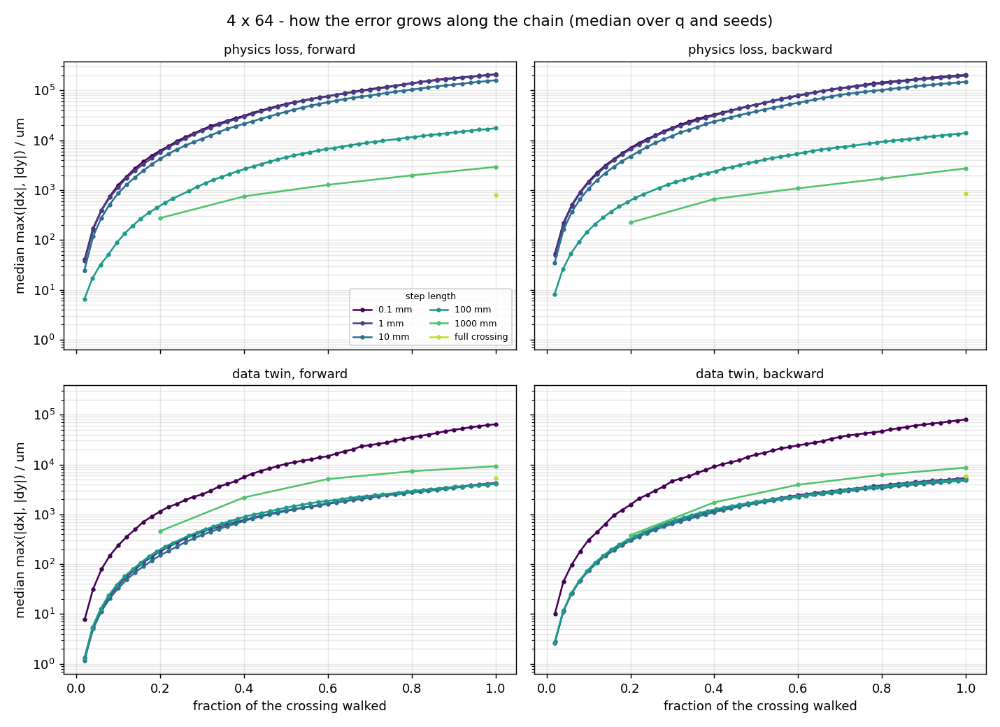

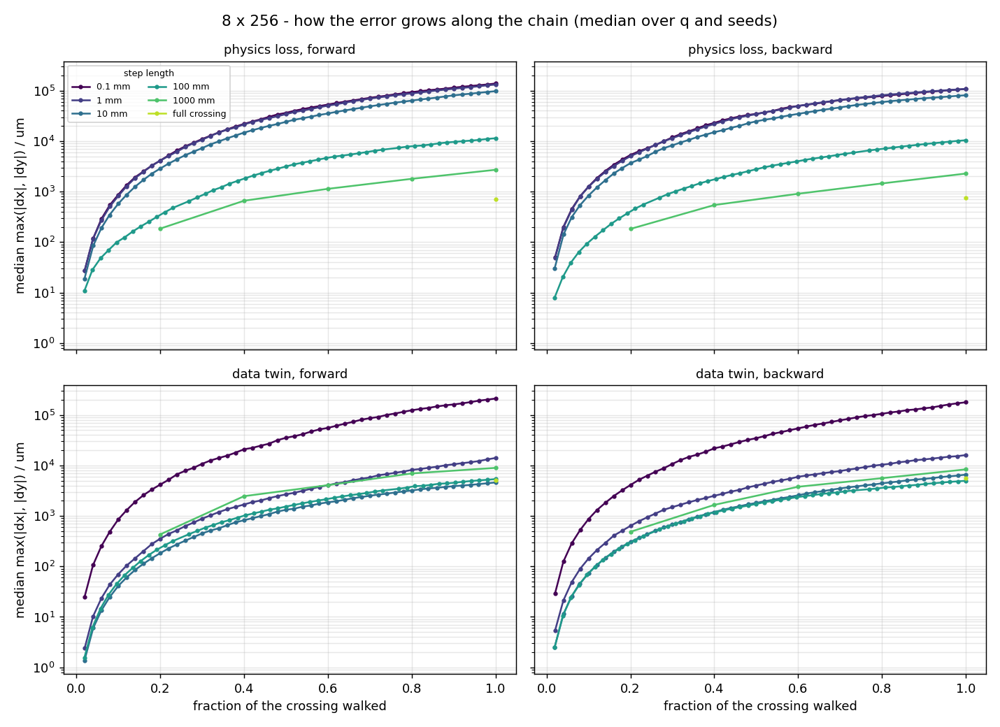

In [9]:
for arch in ("4x64", "8x256"):
    show(os.path.join(F, "chain_growth_%s.png" % arch), width=950)

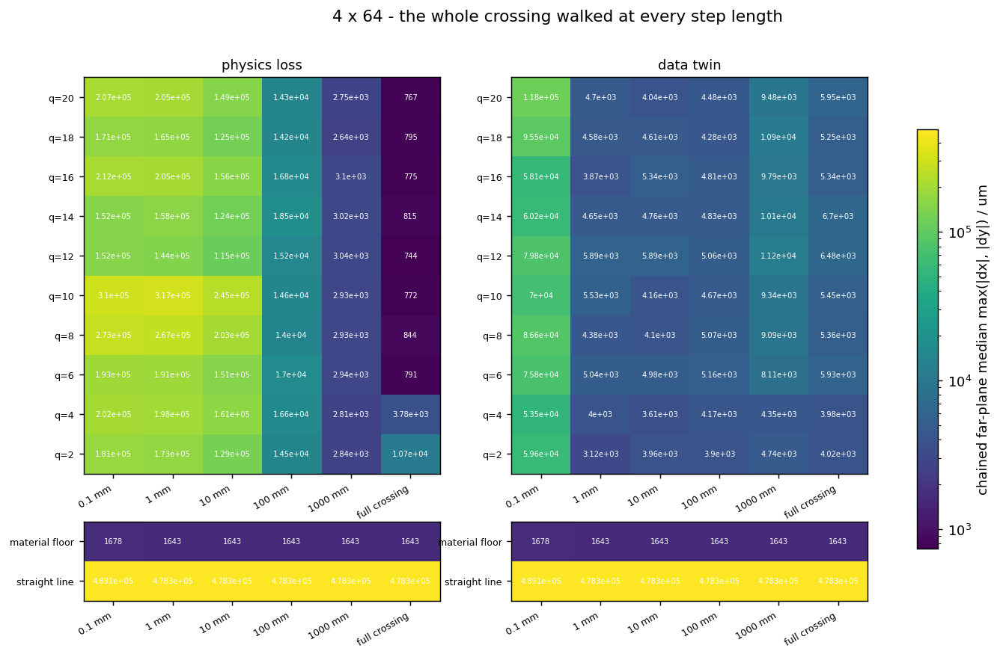

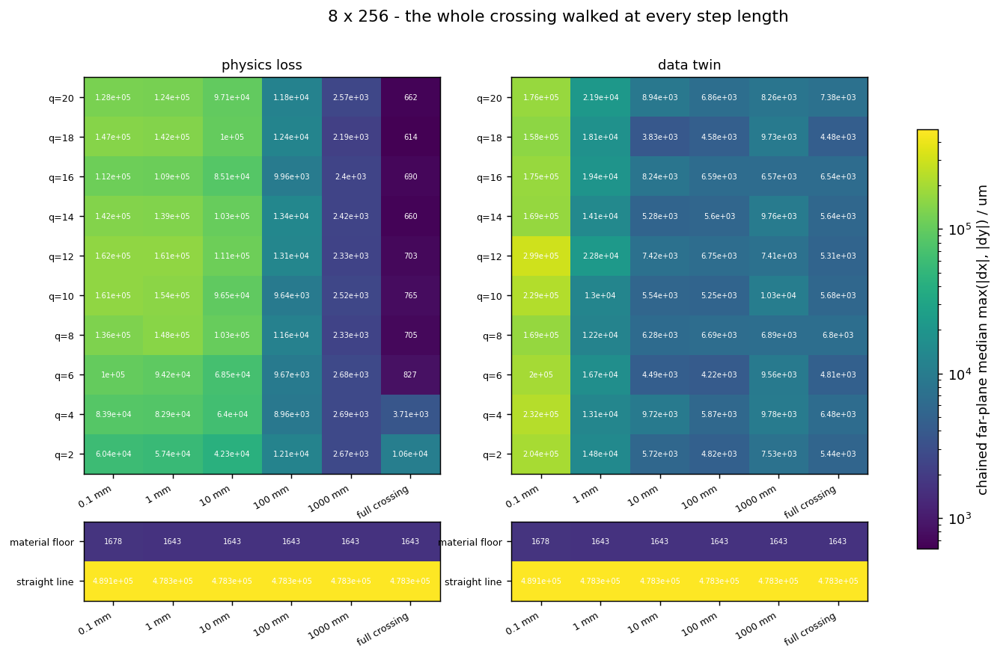

In [10]:
for arch in ("4x64", "8x256"):
    show(os.path.join(F, "chained_heatmap_%s.png" % arch), width=1100)

## The twelve ranked networks

### w128_d8_q14_physics_s0 - physics best (rank 1, 549.3 um at full crossing)

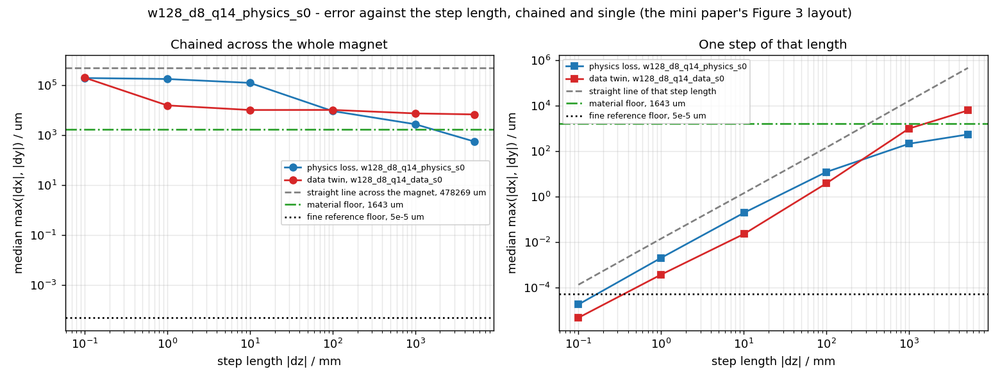

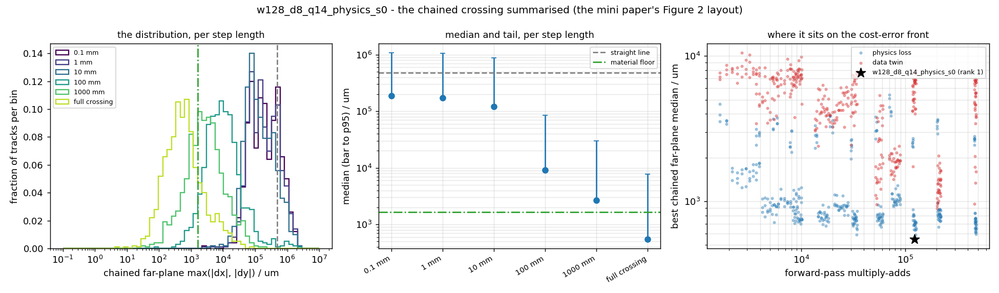

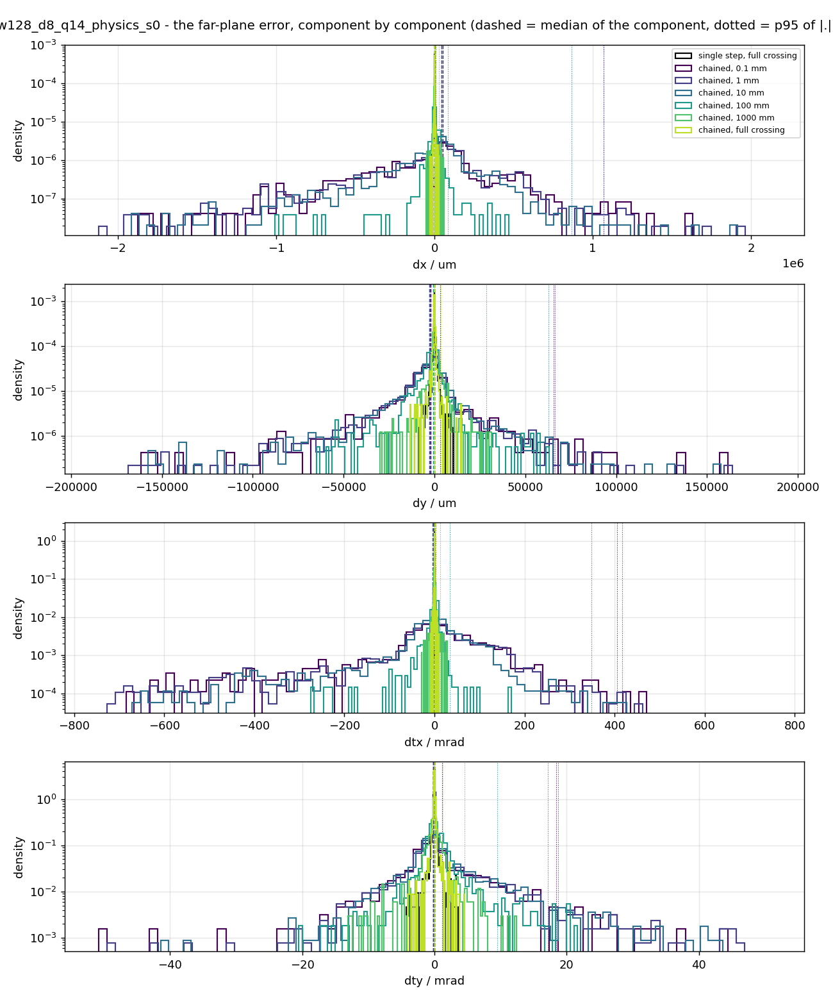

### w128_d8_q12_physics_s2 - physics best (rank 2, 572.6 um at full crossing)

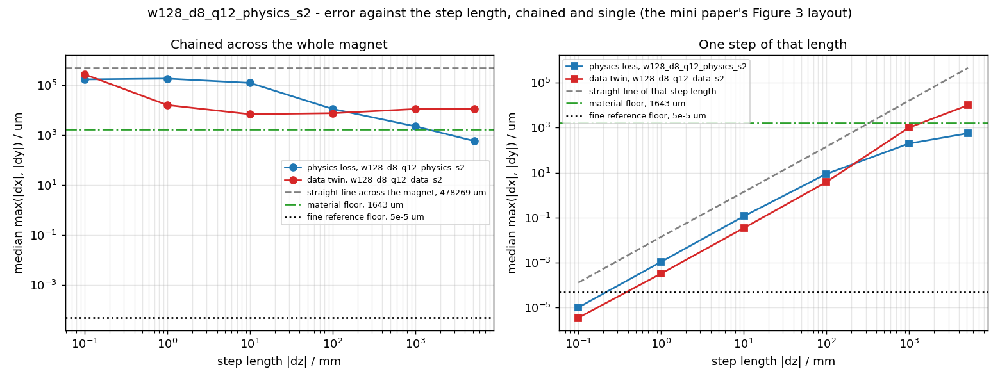

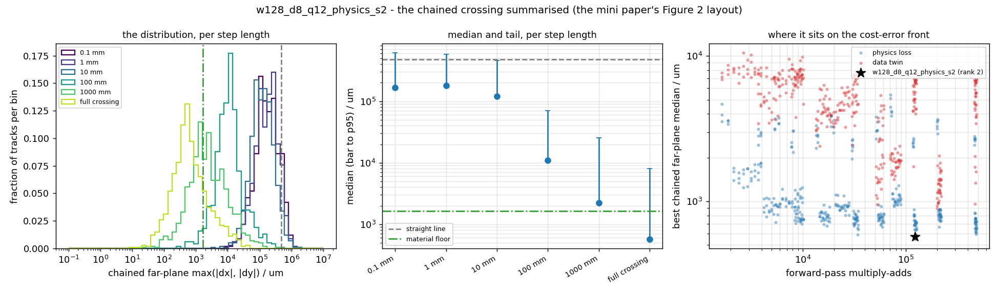

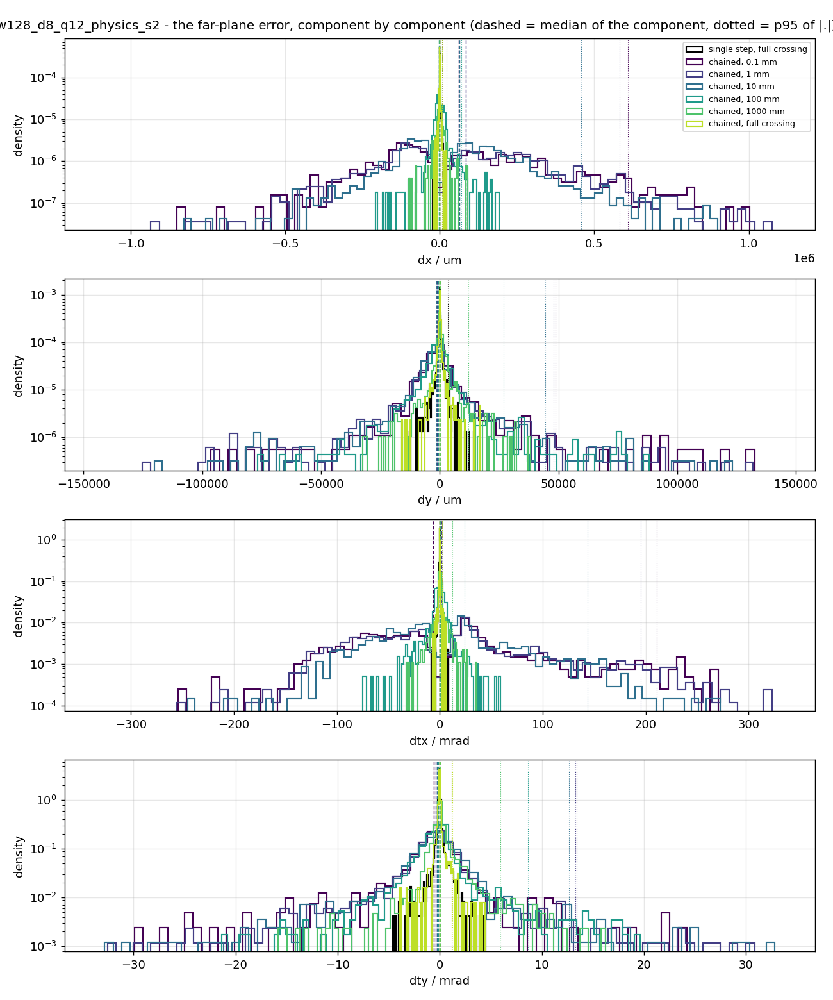

### w128_d8_q18_physics_s0 - physics best (rank 3, 590.3 um at full crossing)

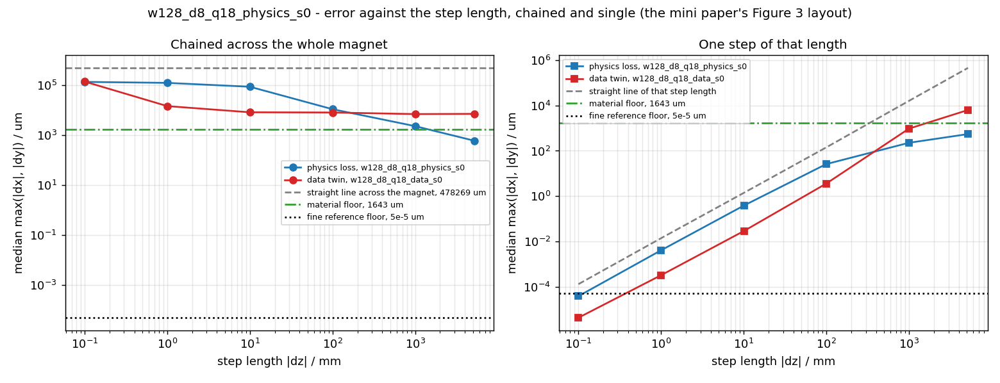

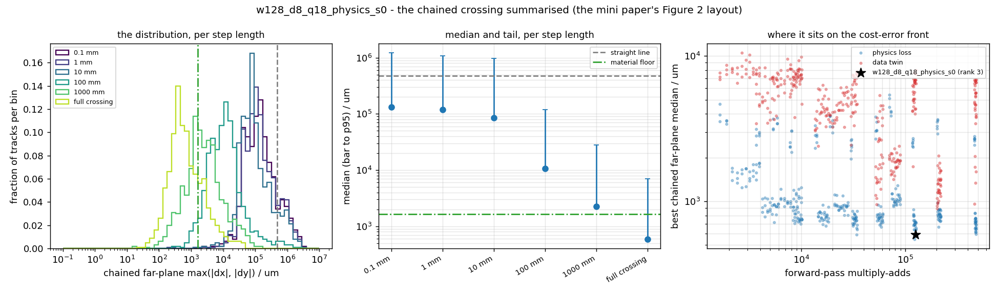

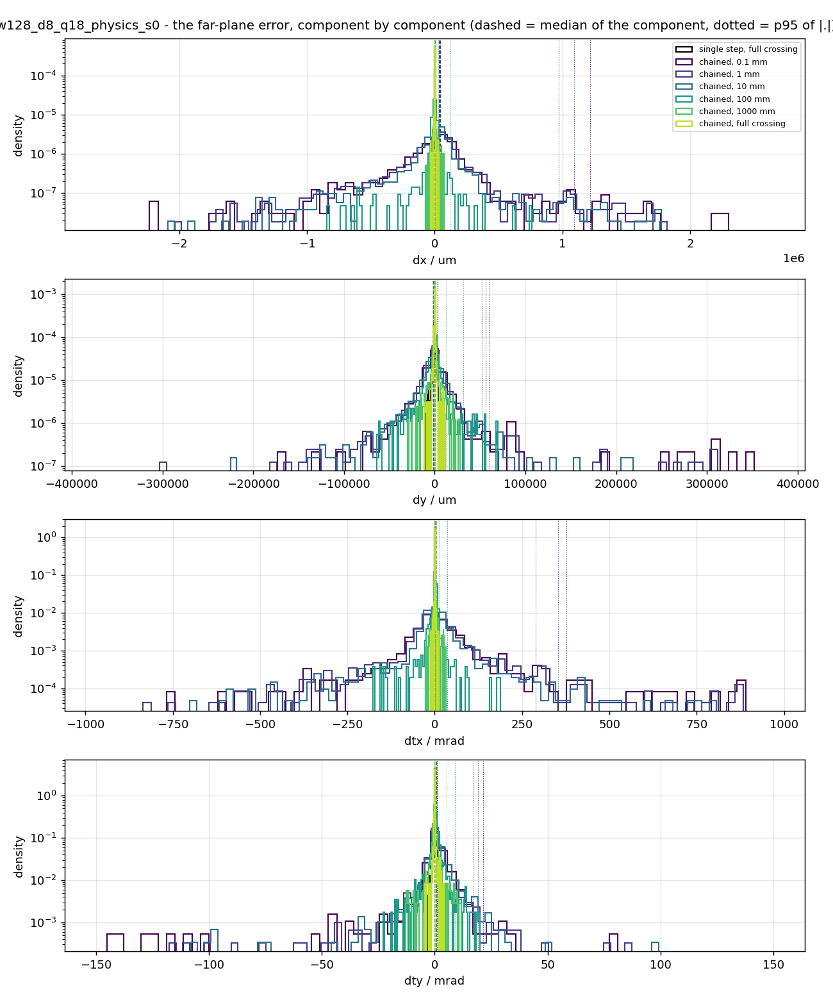

### w256_d2_q02_physics_s2 - physics worst (rank 562, 5394 um at 1000 mm)

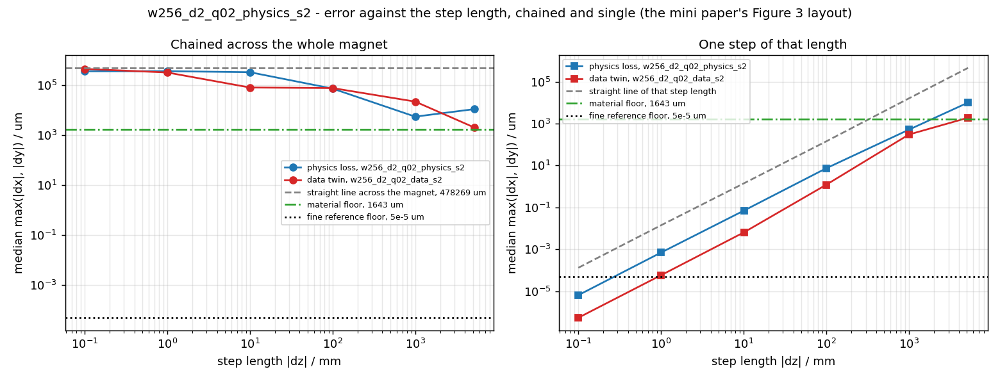

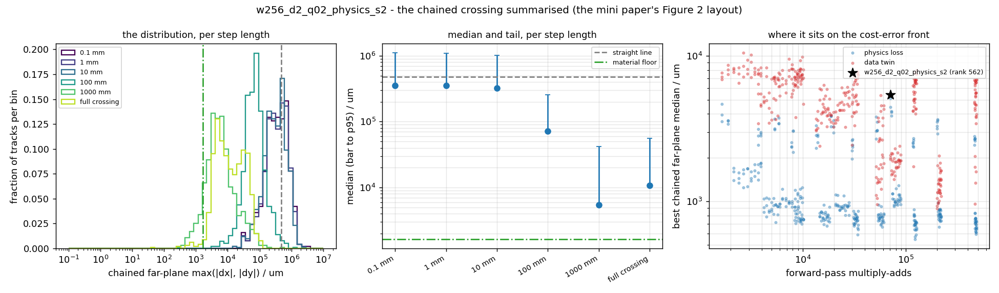

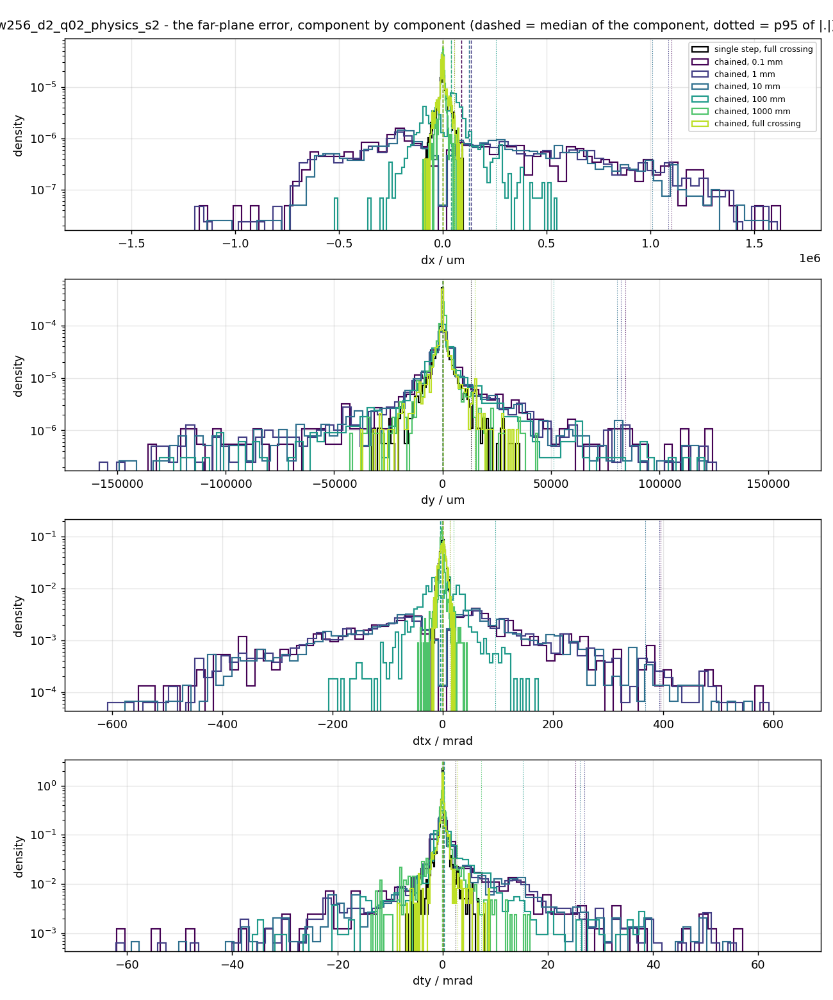

### w256_d2_q02_physics_s1 - physics worst (rank 548, 5086 um at 1000 mm)

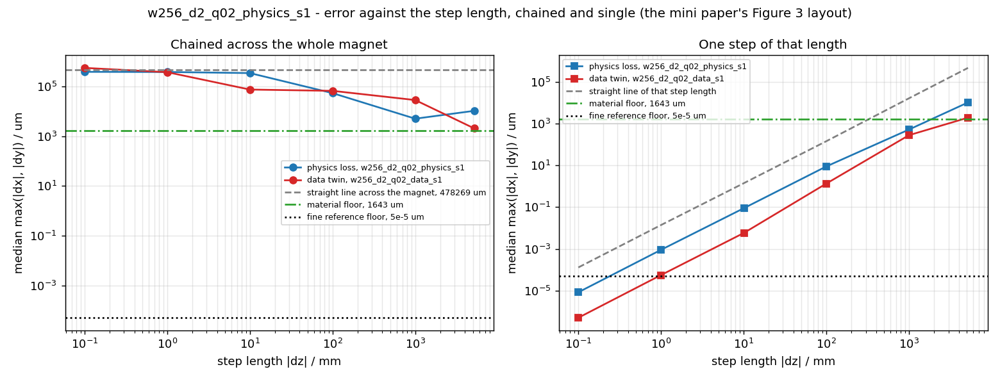

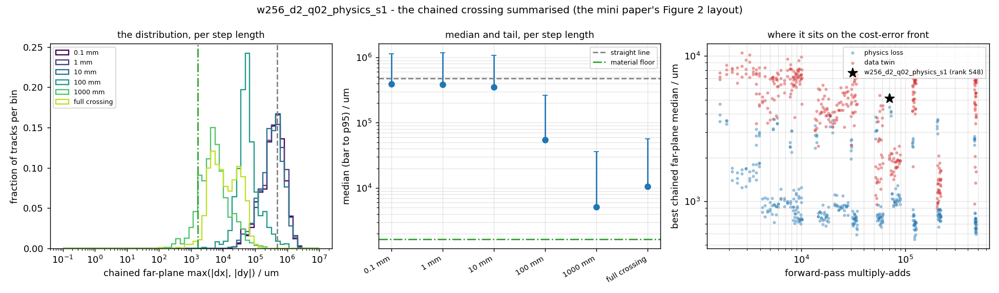

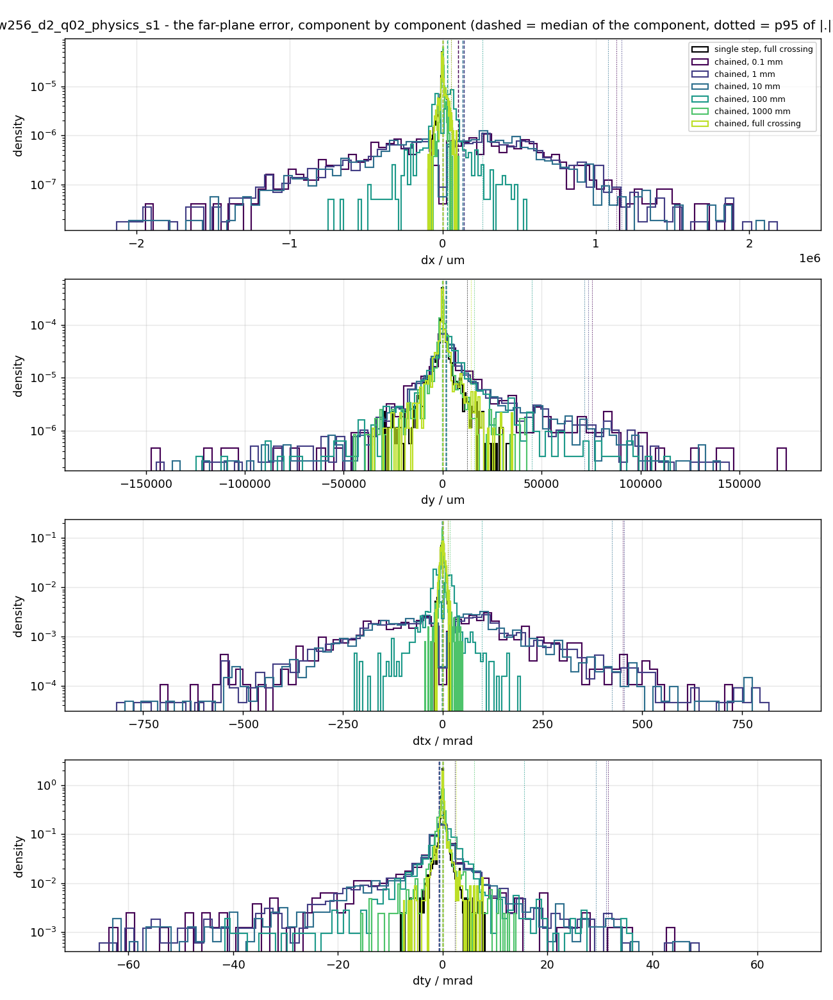

### w32_d2_q02_physics_s1 - physics worst (rank 527, 4669 um at 1000 mm)

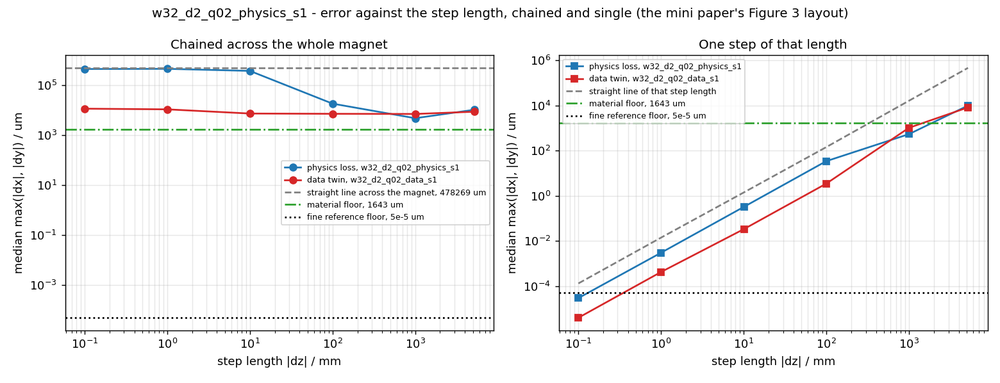

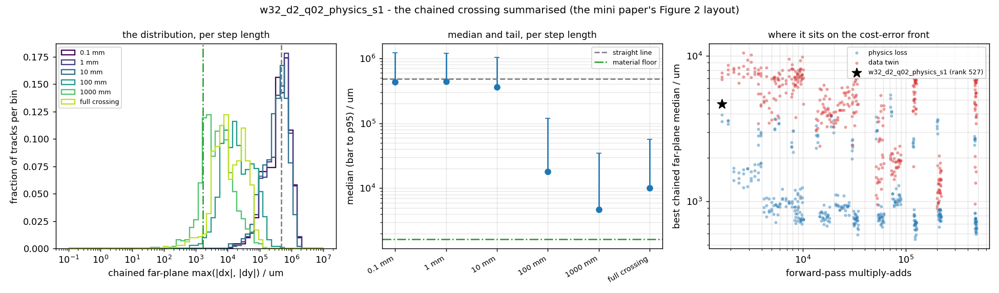

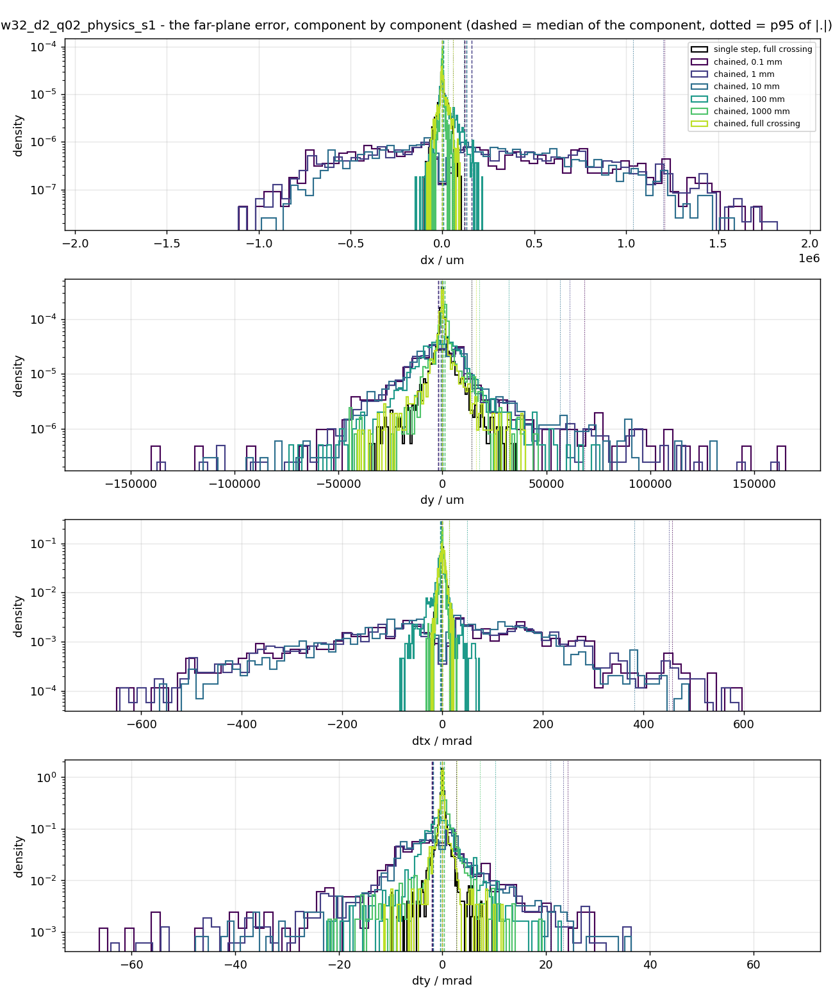

### w256_d4_q02_data_s1 - twin best (rank 175, 893.8 um at 10 mm)

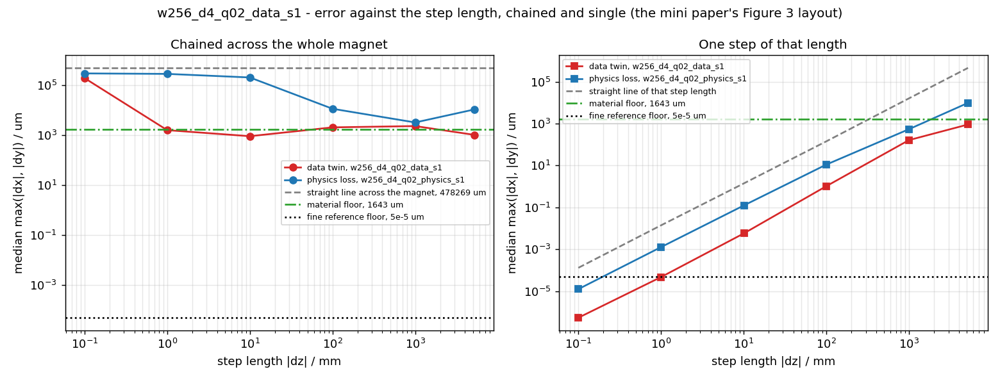

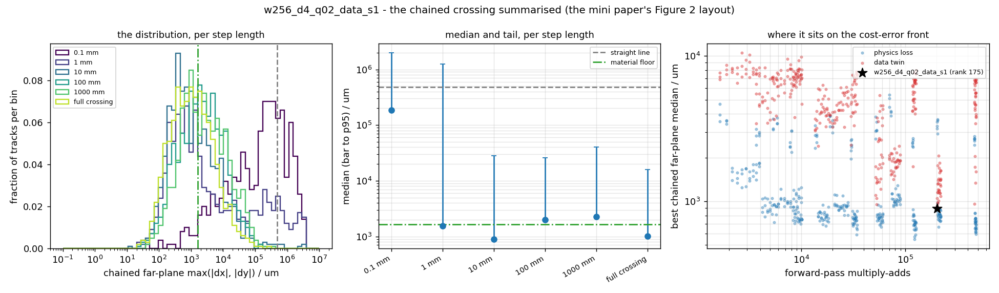

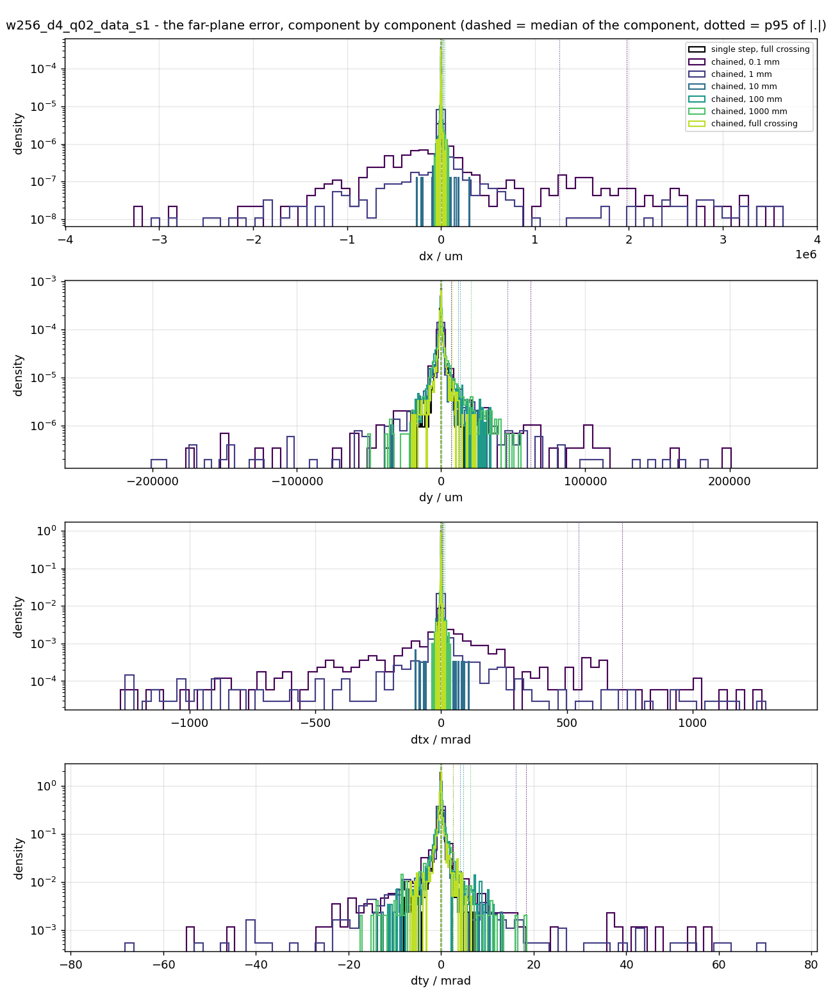

### w256_d4_q02_data_s0 - twin best (rank 196, 928.3 um at full crossing)

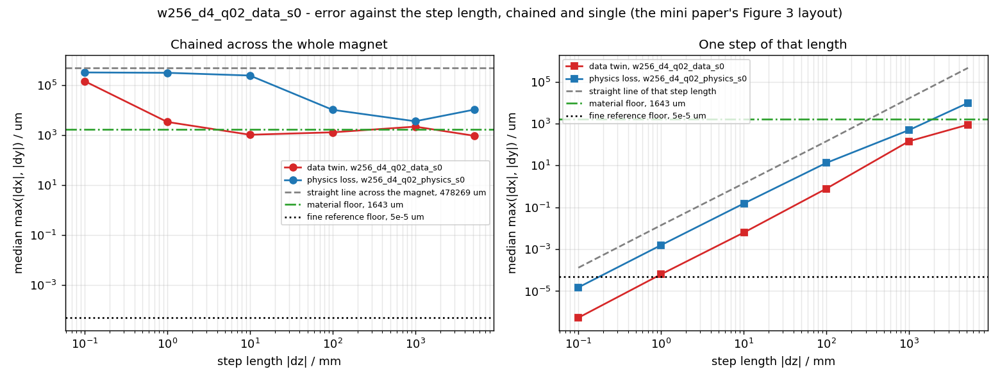

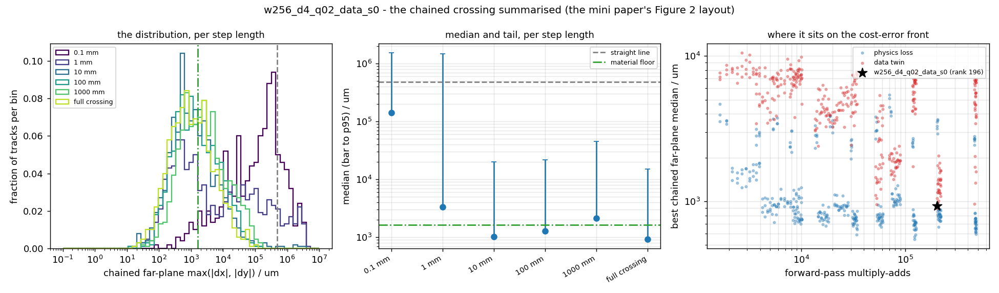

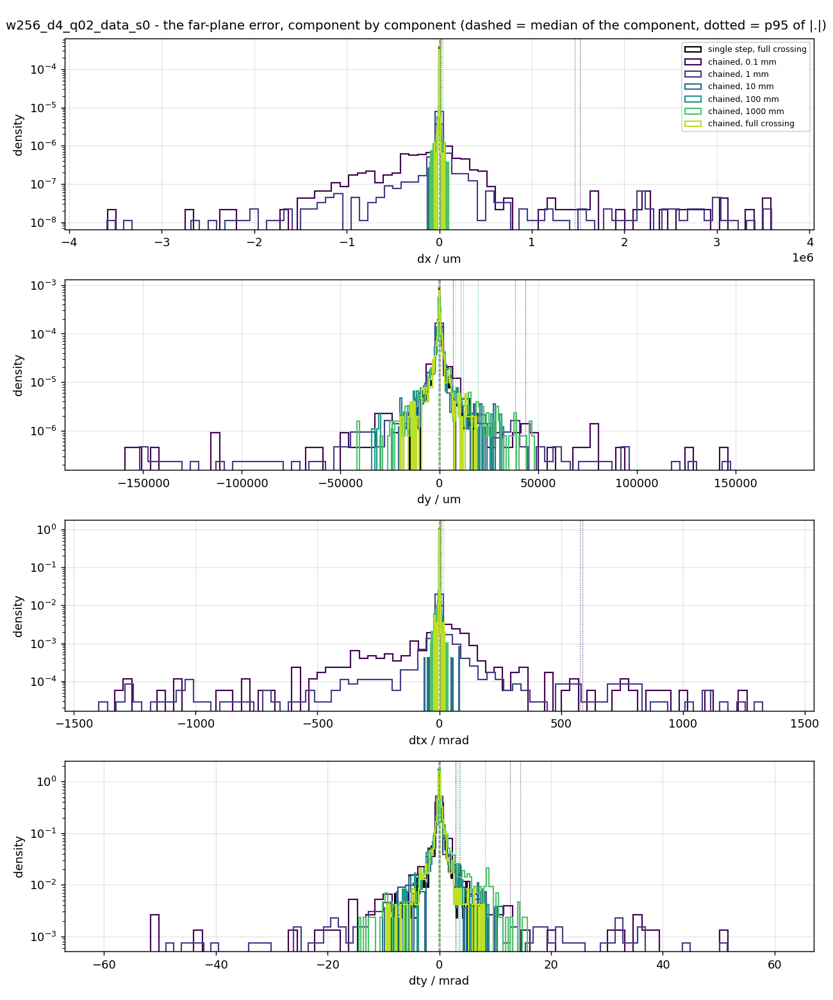

### w128_d4_q04_data_s1 - twin best (rank 213, 954.8 um at full crossing)

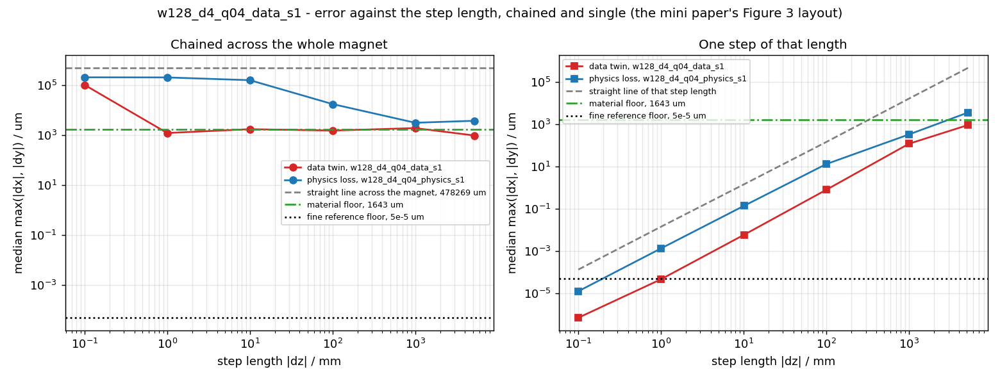

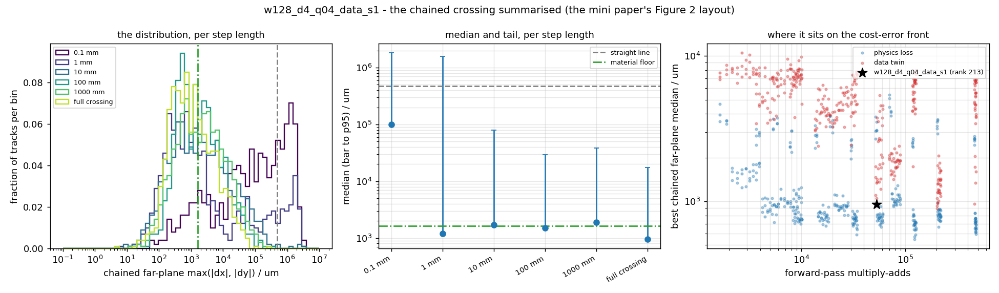

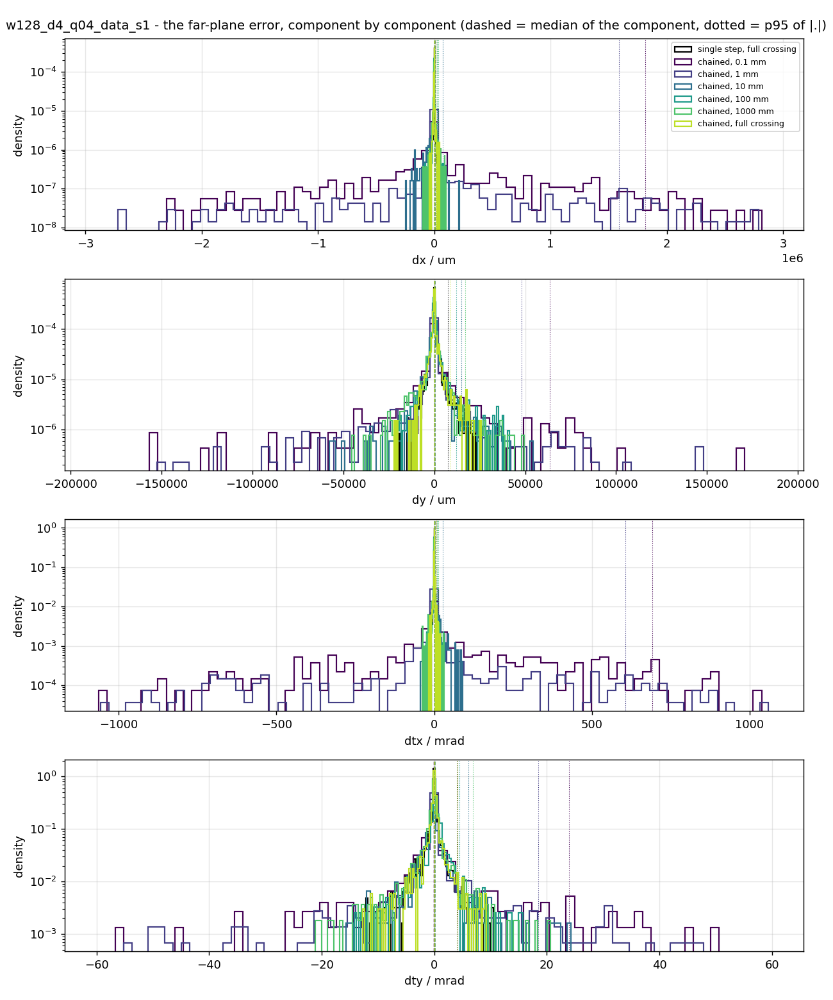

### w32_d2_q10_data_s2 - twin worst (rank 720, 1.048e+04 um at full crossing)

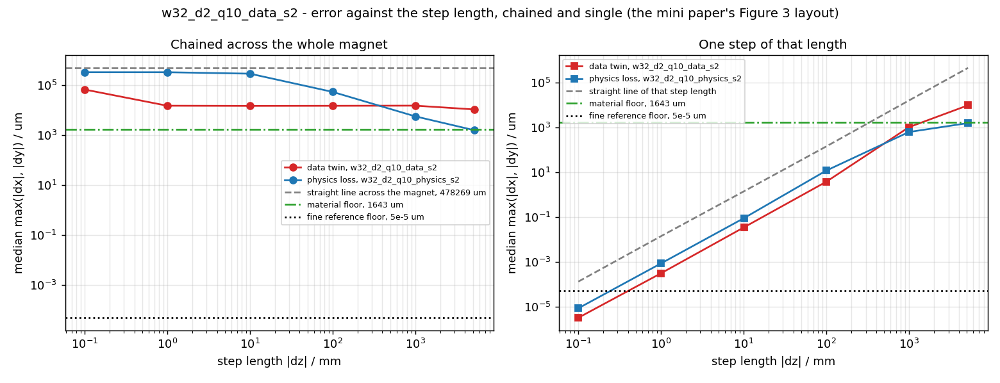

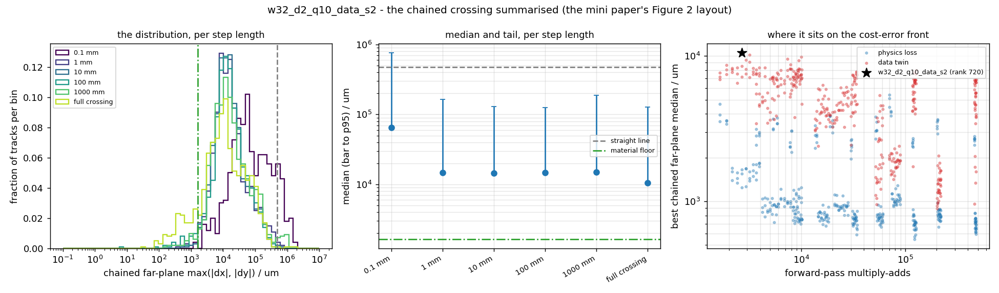

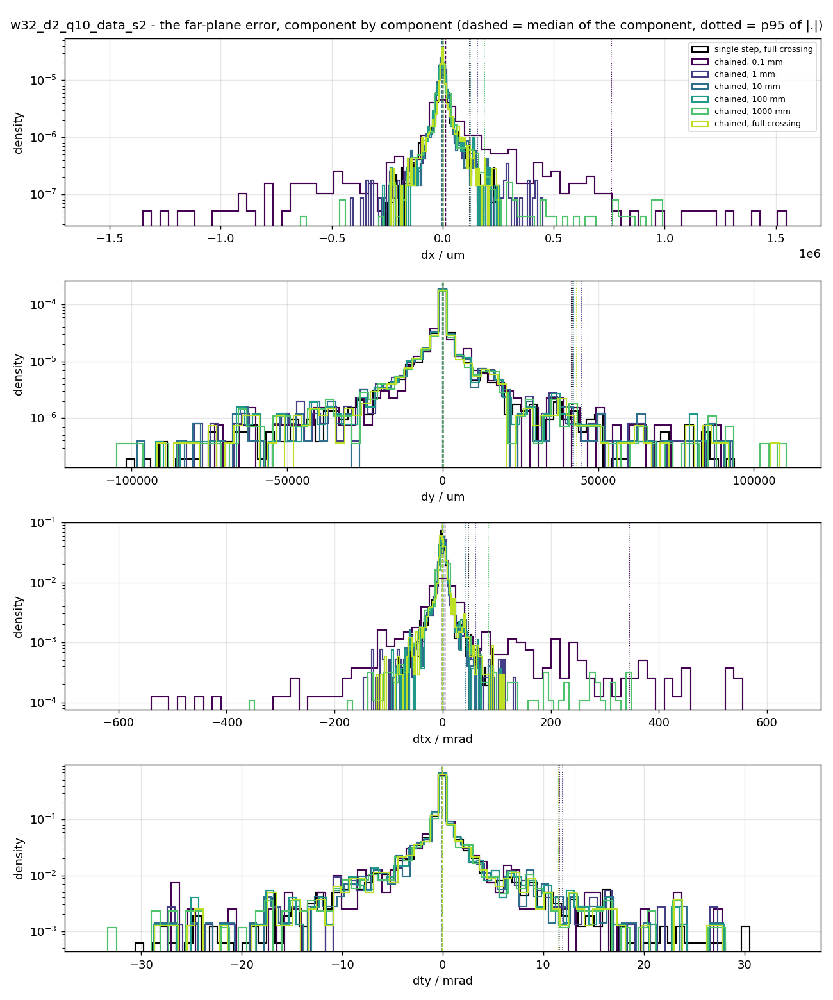

### w32_d2_q14_data_s2 - twin worst (rank 719, 1.016e+04 um at 1 mm)

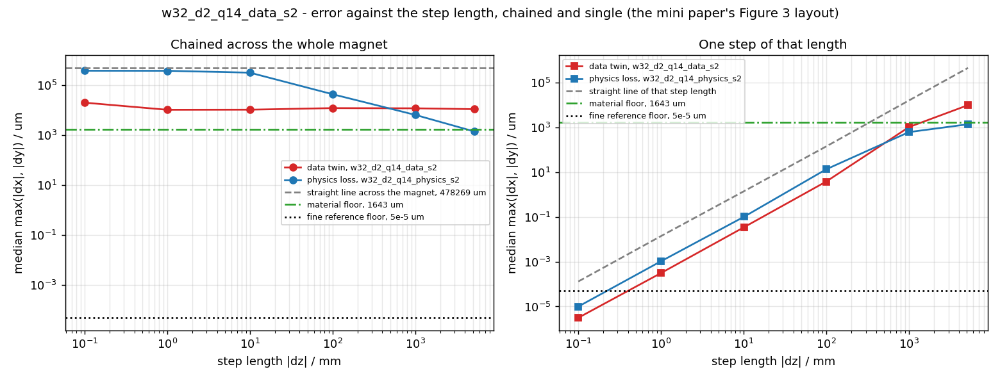

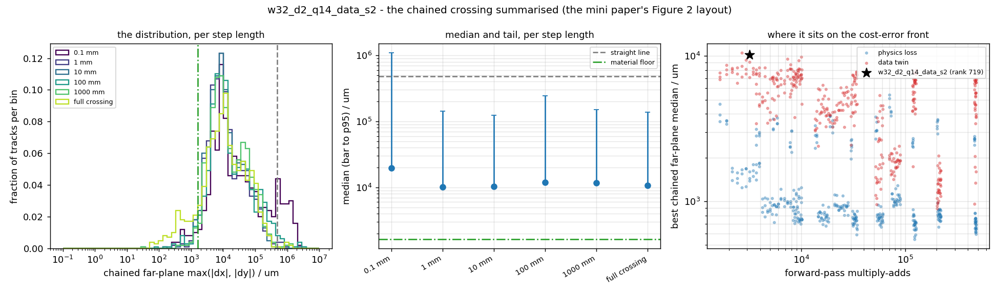

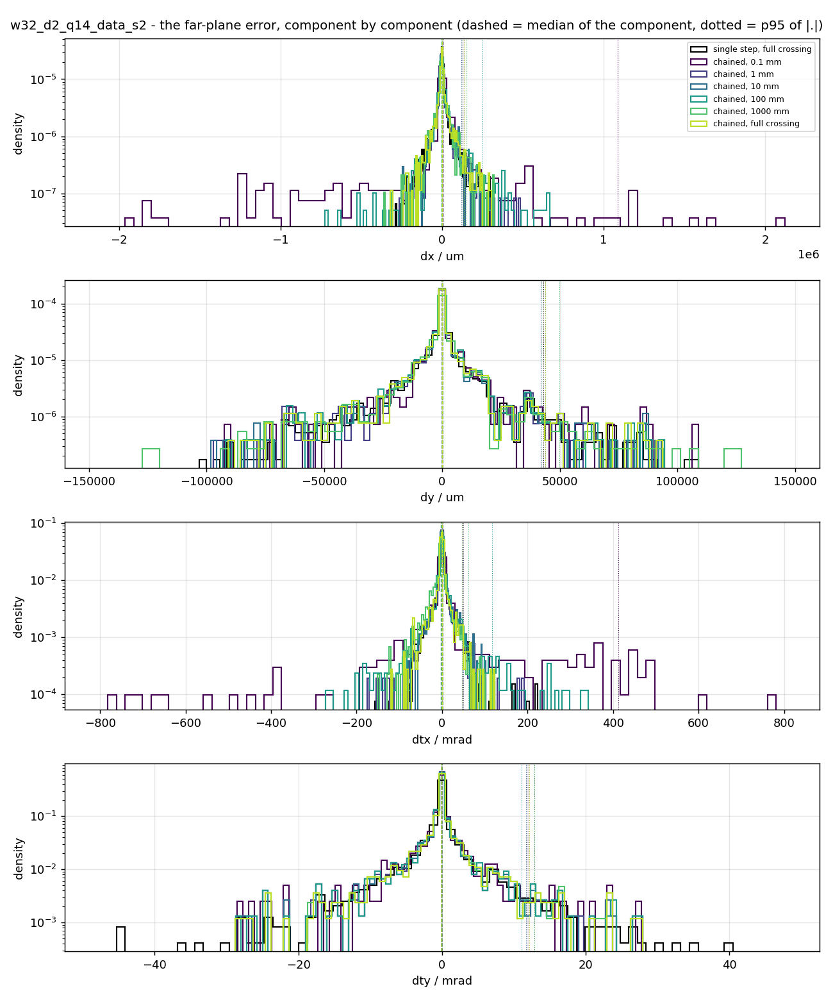

### w64_d2_q20_data_s0 - twin worst (rank 718, 9850 um at 1000 mm)

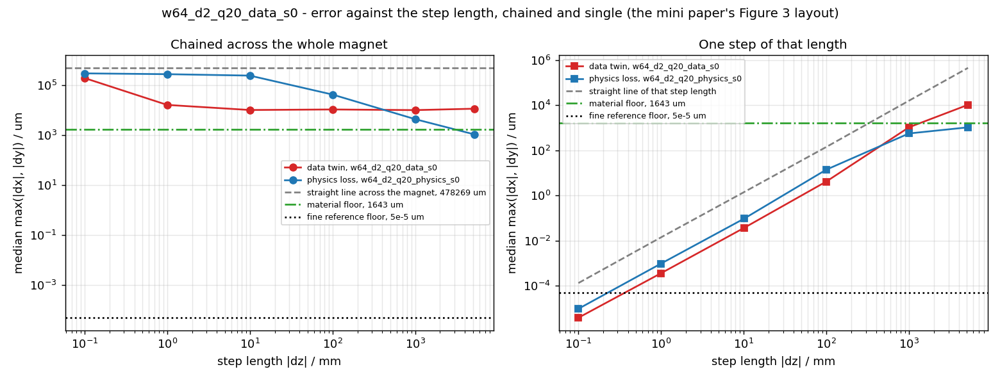

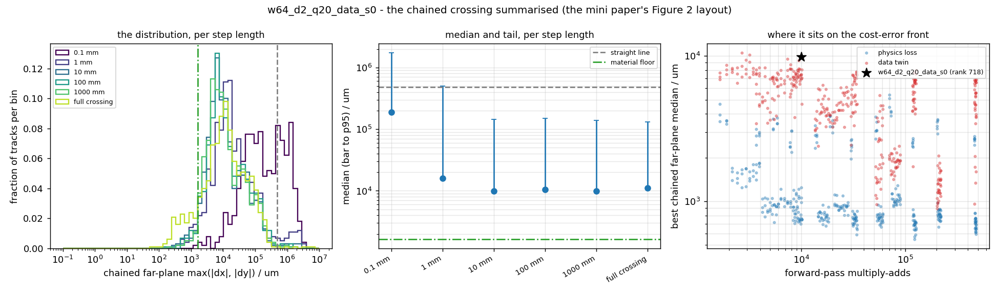

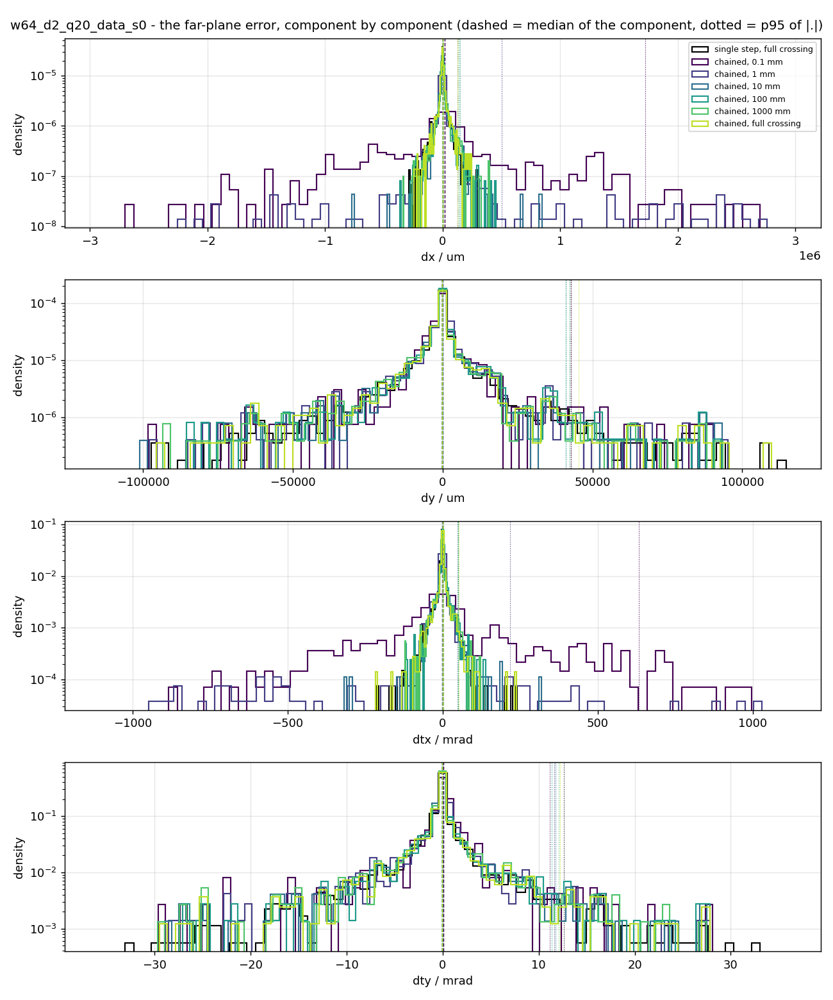

In [11]:
ext = pd.read_csv(os.path.join(R, "ranking_extremes.csv"))
for _, r in ext.iterrows():
    display(Markdown("### %s - %s %s (rank %d, %.4g um at %s)"
                     % (r["tag"], r["arm"], r["group"], r["rank"],
                        r["best_median_um"], r["best_column"])))
    show(os.path.join(F, "mini_fig3_%s.png" % r["tag"]), width=1000)
    show(os.path.join(F, "mini_fig2_%s.png" % r["tag"]), width=1200)
    show(os.path.join(F, "components_%s.png" % r["tag"]), width=800)

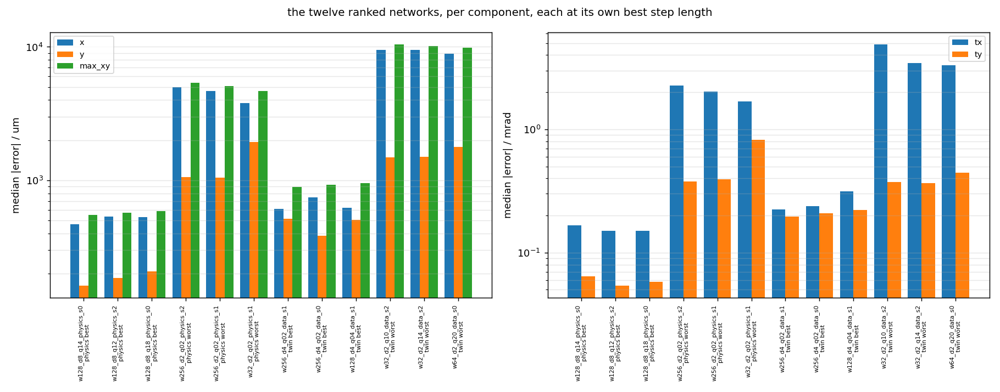

In [12]:
show(os.path.join(F, "best_vs_worst_components.png"), width=1200)